# MIBI-TOF analyses

In [40]:
# Convenient IPython console
# comment it if you execute Jupyterlab on a remote server
%qtconsole --style monokai
# and use instead
# %connect_info
# then jupyter qtconsole --style monokai --existing ./remote_kernel-1 --ssh alexis@10.31.208.90

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from pathlib import Path
from time import time
import copy
from skimage import color
import matplotlib as mpl
import napari

from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_validate, GridSearchCV, RandomizedSearchCV
from scipy.stats import loguniform

import umap
# if not installed run: conda install -c conda-forge umap-learn
import hdbscan
from sklearn.cluster import OPTICS, cluster_optics_dbscan

from skimage import io

from scipy.stats import ttest_ind    # Welch's t-test
from scipy.stats import mannwhitneyu # Mann-Whitney rank test
from scipy.stats import ks_2samp     # Kolmogorov-Smirnov statistic

In [2]:
# viewer = napari.Viewer()

In [3]:
import sys
sys.path.extend([
    '../../tysserand',
    '../../mosna',
])

In [4]:
from tysserand import tysserand as ty
from mosna import mosna

In [5]:
# If need to reload modules after their modification
from importlib import reload
ty = reload(ty)
mosna = reload(mosna)
sns = reload(sns)
plt = reload(plt)

In [6]:
data_dir = Path("../../Commons/Common_data/MIBI-TOF__Triple_Negative_Breast_Cancer__Angelo_lab/processed_data")
samples_path = data_dir / "patient_class.csv"
objects_path = data_dir / "cellData.csv"
images_path = list(data_dir.glob('*.tiff'))

In [7]:
# relate image paths to sample numbers
import re

img_path_samples = [int(re.search('/processed_data/p(.+?)_labeledcell', str(s)).group(1)) for s in images_path]
pat_img = pd.Series(images_path, index=img_path_samples)

##### Samples data

In [8]:
samples = pd.read_csv(samples_path, index_col=0, header=None, names=['sample', 'response'])
samples

,response
sample,
1,0
2,0
3,1
4,1
5,1
6,1
7,0
8,0
9,1


### Objects data

In [9]:
obj = pd.read_csv(objects_path)
obj

,SampleID,cellLabelInImage,cellSize,C,Na,Si,P,Ca,Fe,dsDNA,...,MPO,Keratin6,HLA_Class_1,Ta,Au,tumorYN,tumorCluster,Group,immuneCluster,immuneGroup
0,1,2,146,0,-0.59061,0.875220,-2.57650,-0.806060,-0.234400,-1.308000,...,-0.13903,-0.41883,-0.53738,2.48110,2.326600,1,0,6,0,0
1,1,3,102,0,-0.49870,0.017464,-1.22490,-0.501520,-1.341200,0.522570,...,-0.13903,-0.52769,-0.62060,2.30430,2.187100,0,0,2,46,4
2,1,4,43,0,-1.48730,-0.630440,-1.91070,-1.228000,-1.393700,-1.782200,...,-0.13903,0.18774,-1.75050,1.39330,1.478200,1,0,6,0,0
3,1,5,211,0,-1.00530,-0.532270,-1.74300,-0.944850,-1.099600,-0.057906,...,-0.13903,-0.30976,-0.52445,1.88680,1.586200,1,0,6,0,0
4,1,6,177,0,0.15803,-0.710290,0.51737,-0.096251,-1.052600,0.355020,...,-0.13903,-0.52769,-0.99773,-0.51027,-0.496270,0,0,2,75,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
201651,44,1402,198,0,3.79060,1.212600,0.82351,1.194900,0.617350,1.530700,...,-0.13903,-0.34334,-1.74170,-0.60616,-0.049150,1,0,6,0,0
201652,44,1403,111,0,3.89980,0.119160,1.03970,1.089000,-0.075447,1.428700,...,-0.13903,-0.52769,-1.77350,-0.54045,-0.260810,1,1,1,0,0
201653,44,1404,100,0,3.54820,-0.578650,-2.12650,0.803610,-0.788880,0.566460,...,-0.13903,-0.52769,-1.85290,-0.73996,0.055092,1,0,6,0,0
201654,44,1405,129,0,3.59890,2.929000,-1.77210,1.375700,-0.301130,-1.198100,...,-0.13903,-0.52769,-1.85290,0.56260,1.092300,1,0,6,0,0


In [10]:
markers = obj.columns[3:-5]
# avoid control isotopes
markers = [
    'Vimentin', 'SMA', 'B7H3', 'FoxP3', 'Lag3',
    'CD4', 'CD16', 'CD56', 'OX40', 'PD1', 'CD31', 'PD-L1', 'EGFR', 'Ki67',
    'CD209', 'CD11c', 'CD138', 'CD163', 'CD68', 'CSF-1R', 'CD8', 'CD3',
    'IDO', 'Keratin17', 'CD63', 'CD45RO', 'CD20', 'p53', 'Beta catenin',
    'HLA-DR', 'CD11b', 'CD45', 'H3K9ac', 'Pan-Keratin', 'H3K27me3',
    'phospho-S6', 'MPO', 'Keratin6', 'HLA_Class_1',
]

In [11]:
other_cols = [x for x in obj.columns if x not in markers]
other_cols

['SampleID',
 'cellLabelInImage',
 'cellSize',
 'C',
 'Na',
 'Si',
 'P',
 'Ca',
 'Fe',
 'dsDNA',
 'Background',
 'Ta',
 'Au',
 'tumorYN',
 'tumorCluster',
 'Group',
 'immuneCluster',
 'immuneGroup']

In [12]:
common_ids = list(set(samples.index).intersection(set(obj['SampleID'].unique())))

## Load one sample

In [44]:
sample = 30
im = io.imread(pat_img[sample])

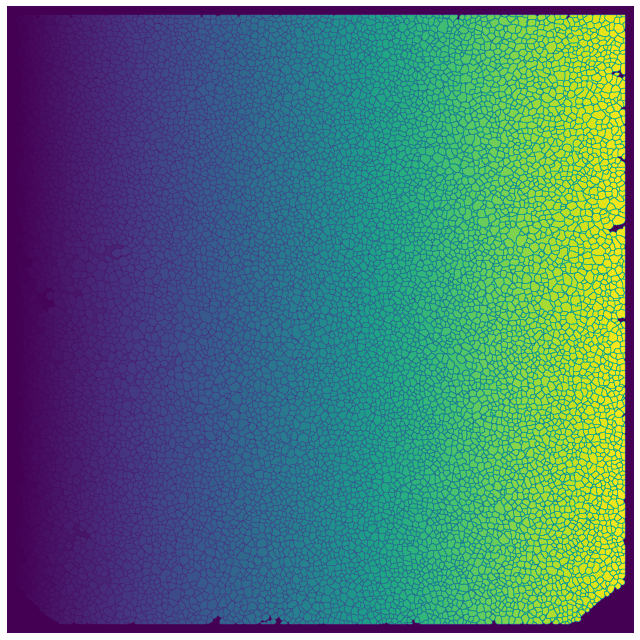

In [45]:
# label_cmap = mpl.cm.get_cmap('Set2')(range(8))
# ty.showim(color.label2rgb(im, bg_label=0, colors=label_cmap));
ty.showim(im);

In [46]:
exp = obj[obj['SampleID'] == sample]

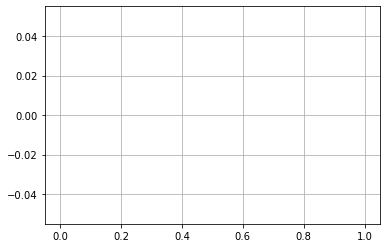

In [47]:
exp['cellSize'].hist(bins=50);

/tmp/ipykernel_52205/2203204585.py:7: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("viridis").copy()
  current_cmap.set_bad(color='red')


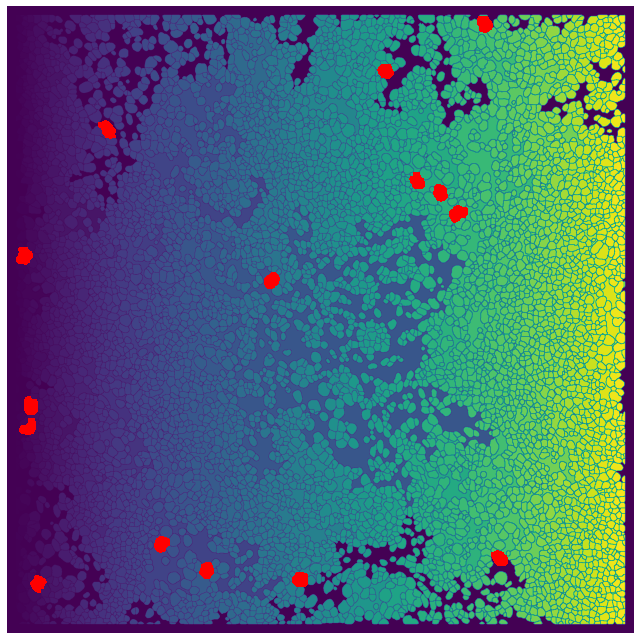

In [20]:
thresh = 1500
obj_drop = exp.loc[exp['cellSize'] > thresh, 'cellLabelInImage']
im_drop = im.astype(float)
for i in obj_drop.values:
    im_drop[im_drop == i] = np.nan
current_cmap = mpl.cm.get_cmap()
current_cmap.set_bad(color='red')
ty.showim(im_drop);

In [21]:
maxi = exp['cellSize'].max()
maxi

1947

In [22]:
cellid = exp.loc[exp['cellSize']==maxi,'cellLabelInImage']
cellid

12434    5027
Name: cellLabelInImage, dtype: int64

In [23]:
exp.loc[exp['cellLabelInImage']==5027, :]

,SampleID,cellLabelInImage,cellSize,C,Na,Si,P,Ca,Fe,dsDNA,...,MPO,Keratin6,HLA_Class_1,Ta,Au,tumorYN,tumorCluster,Group,immuneCluster,immuneGroup
12434,3,5027,1947,0,-0.4088,-0.56441,0.31766,-0.31962,-0.09109,0.41779,...,-0.13903,0.079928,-1.1137,-0.68921,-0.78982,1,0,6,0,0


In [24]:
im[im==cellid.values].size

1947

In [25]:
unim = pd.Series(np.unique(im))
select = ~unim.isin(exp['cellLabelInImage'])
val_miss = unim.values[select]

/tmp/ipykernel_52205/44949155.py:5: MatplotlibDeprecationWarning: You are modifying the state of a globally registered colormap. This has been deprecated since 3.3 and in 3.6, you will not be able to modify a registered colormap in-place. To remove this warning, you can make a copy of the colormap first. cmap = mpl.cm.get_cmap("viridis").copy()
  current_cmap.set_bad(color='red')


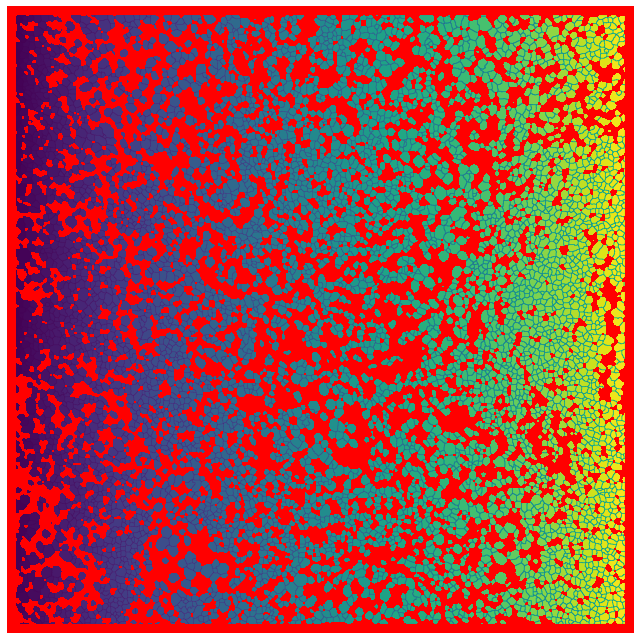

In [26]:
im_drop = im.astype(float)
for i in val_miss[1:]:
    im_drop[im_drop == i] = np.nan
current_cmap = mpl.cm.get_cmap()
current_cmap.set_bad(color='red')
ty.showim(im_drop);

Values in images that are absent in `cellLabelInImage` were previously detected as background

In [11]:
def clean_from_presence(im, values, target_val=0):
    """
    Set to a target values elements in im that are
    not present in values
    
    Example:
    >>> im = clean_from_presence(im, values=exp['cellLabelInImage'])
    """
    
    unim = pd.Series(np.unique(im))
    select = ~unim.isin(values)
    val_miss = unim.values[select]
    for i in val_miss:
        im[im == i] = target_val
    return im

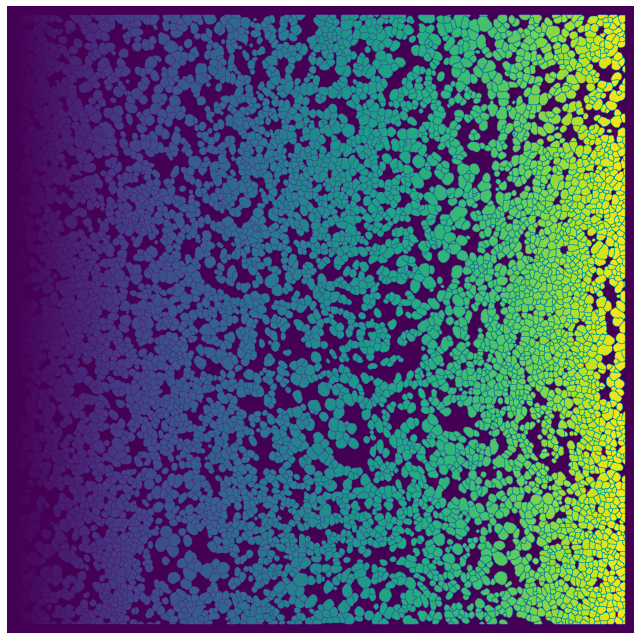

In [28]:
im = clean_from_presence(im, values=exp['cellLabelInImage'])
ty.showim(im);

In [25]:
# with napari.gui_qt():
viewer = napari.view_image(im)

Validation errors in config file(s).
The following fields have been reset to the default value:

plugins -> call_order
  none is not an allowed value (type=type_error.none.not_allowed)



#### Build network

In [24]:
# def refactor_coords_pairs(coords, pairs):
#     """
#     Transforms coordinates and pairs of nodes data from segmented areas into
#     the formats used by the other functions for network analysis and visualization.

#     Parameters
#     ----------
#     coords : dataframe
#         Coordinates of points with columns corresponding to axes ('x', 'y', ...)
#     pairs : ndarray
#         Pairs of neighbors given by the first and second element of each row, 
#         values correspond to values in masks, which are different from index
#         values of nodes

#     Returns
#     -------
#     coords : ndarray
#         Coordinates of points where each column corresponds to an axis (x, y, ...)
#     pairs : ndarray
#         Pairs of neighbors given by the first and second element of each row.
#     """
    
#     mapper = dict(zip(coords.index, np.arange(coords.shape[0])))
#     pairs = pd.DataFrame({'source': pairs[:,0], 'target': pairs[:,1]})
#     pairs['source'] = pairs['source'].map(mapper)
#     pairs['target'] = pairs['target'].map(mapper)
#     coords = coords.loc[:, ['x', 'y']].values
#     pairs = pairs.loc[:, ['source', 'target']].values
#     return coords, pairs

In [26]:
med = exp['cellSize'].median()
r_med = np.sqrt(med / np.pi)
r_med = int(r_med/2)
r_med

5

In [26]:
# from tqdm import tqdm
# import itertools

# def build_contacting(masks, r=1, ski_val=0):
#     """
#     Build a network from segmented regions that contact each other or are 
#     within a given distance from each other.

#     Parameters
#     ----------
#     masks : array_like
#         2D array of integers defining the identity of masks
#         0 is background (no object detected)
#     r : int
#         Radius of search.
#     ski_val : int, list(int), default 0
#         Values of objects ids to ignore, like background value.

#     Returns
#     -------
#     pairs : ndarray
#         Pairs of neighbors given by the first and second element of each row, 
#         values correspond to values in masks, which are different from index
#         values of nodes

#     """
#     source_nodes = []
#     target_nodes = []
# #     if ski_val is not None:
# #         ski_val = 
#     for i in tqdm(np.unique(masks)[1:], desc="objects"):
#         neigh = ty.find_neighbors(masks, i, r=r)
#         source_nodes.append([i]*(neigh.size))
#         target_nodes.append(neigh)
#     # flatten arrays of arrays
#     source_nodes = np.fromiter(itertools.chain.from_iterable(source_nodes), int).reshape(-1,1)
#     target_nodes = np.fromiter(itertools.chain.from_iterable(target_nodes), int).reshape(-1,1)
#     # remove duplicate pairs
#     pairs = np.hstack((source_nodes, target_nodes))
#     pairs = np.sort(pairs, axis=1)
#     pairs = np.unique(pairs, axis=0)
#     return pairs

## All samples parameter screening

In [ ]:
processed_dir = Path('../data/processed/MIBI-TOF_TNBC')
save_dir = processed_dir / "all_samples_reconstruction_parameters"

if not os.path.exists(save_dir):
    os.makedirs(save_dir)

obj_size_thresh = 1250
k_sol = 2
dist_threshold = 50

for sample in obj['SampleID'].unique():
    print(f"processing sample {sample}")
    
    # ------ Open and pre-process sample image and objects data ------
    im = io.imread(pat_img[sample])
    exp = obj[obj['SampleID'] == sample]
    plt.figure()
    exp['cellSize'].hist(bins=50);
    title = f"sample-{sample}_histogram_objects_size"
    plt.savefig(str(save_dir / title) + '.png', bbox_inches='tight')
    plt.show()
    plt.close()

    
    obj_drop = exp.loc[exp['cellSize'] > obj_size_thresh, 'cellLabelInImage']
    # float image just for visualization with nan values
    im_drop = im.astype(float)
    for i in obj_drop.values:
        select = im_drop == i
        im_drop[select] = np.nan
        im[select] = 0
    current_cmap = mpl.cm.get_cmap().copy()
    current_cmap.set_bad(color='red')
    ty.showim(im_drop);
    title = f"sample-{sample}_image_bad_objects"
    plt.savefig(str(save_dir / title) + '.png', bbox_inches='tight')
    plt.show()
    plt.close()
    im[im_drop == i] = 0

    # Values in images that are absent in cellLabelInImage were previously detected as background
    im = clean_from_presence(im, values=exp['cellLabelInImage'])
    ty.showim(im);
    title = f"sample-{sample}_image_cleaned"
    plt.savefig(str(save_dir / title) + '.png', bbox_inches='tight')
    plt.show()
    plt.close()
    
    # Contacting areas
    r_med = 5
    for r in [2, 5]:
        start = time()
        pairs = ty.build_contacting(im, r=r)
        end = time()
        print(f"running time: {end-start}s for {np.unique(im)[1:].size} objects")

        # reencode the coordinates to match node positions with their respective areas
        coords = ty.mask_val_coord(im)
        coords, pairs = ty.refactor_coords_pairs(coords, pairs)
        
        title = f"sample-{sample}_coords"
        np.savetxt(str(save_dir / title) + '.csv',
                   coords, 
                   fmt='%.18e', delimiter=',', newline='\n', header='x,y')
        title = f"sample-{sample}_pairs_contacting-area_r-{r}"
        np.savetxt(str(save_dir / title) + '.csv',
                   pairs,
                   fmt='%u', delimiter=',', newline='\n', header='source,target')
        distances = ty.distance_neighbors(coords, pairs)
        ty.plot_network_distances(coords, pairs, distances, figsize=(18,15), size_nodes=10);
        plt.axis('off');
        title = f"sample-{sample}_network_contacting-area_r-{r}"
        plt.savefig(str(save_dir / title) + '.png', bbox_inches='tight', facecolor='white')
        plt.show()
        plt.close()
        
        # link solitary nodes to their closest neighbors
        pairs = ty.link_solitaries(coords, pairs, k=k_sol)
        title = f"sample-{sample}_pairs_contacting-area_r-{r}_k_sol-{k_sol}"
        np.savetxt(str(save_dir / title) + '.csv',
                   pairs,
                   fmt='%u', delimiter=',', newline='\n', header='source,target')
        distances = ty.distance_neighbors(coords, pairs)
        ty.plot_network_distances(coords, pairs, distances, figsize=(18,15), size_nodes=10);
        plt.axis('off');
        title = f"sample-{sample}_network_contacting-area_r-{r}_k_sol-{k_sol}"
        plt.savefig(str(save_dir / title) + '.png', bbox_inches='tight', facecolor='white')
        plt.show()
        plt.close()
    
    # Delaunay triangulation
    pairs = ty.build_delaunay(coords, trim_dist=False)
    distances = ty.distance_neighbors(coords, pairs)

    ty.plot_network_distances(coords, pairs, distances, figsize=(18,15), size_nodes=10);
    plt.axis('off');
    title = f"sample-{sample}_network_delaunay_all_distances"
    plt.savefig(str(save_dir / title) + '.png', bbox_inches='tight', facecolor='white')
    plt.show()
    plt.close()
    
    plt.figure()
    plt.hist(distances, bins=50);
    title = f"sample-{sample}_histogram_delaunay_distances"
    plt.savefig(str(save_dir / title) + '.png', bbox_inches='tight')
    plt.show()
    plt.close()

    # trim edges with 'percentile_size' method
    trim_dist = ty.find_trim_dist(dist=distances, method='percentile_size', nb_nodes=coords.shape[0])
    
    select = distances < trim_dist
    pairs_selected = pairs[select,:]
    title = f"sample-{sample}_pairs_delaunay_trim-percentile_size-{trim_dist}"
    np.savetxt(str(save_dir / title) + '.csv',
               pairs_selected,
               fmt='%u', delimiter=',', newline='\n', header='source,target')
    ty.plot_network_distances(coords, pairs_selected, distances[select], figsize=(18,15), size_nodes=10);
    plt.axis('off');
    title = f"sample-{sample}_network_delaunay_trim-percentile_size-{trim_dist}"
    plt.savefig(str(save_dir / title) + '.png', bbox_inches='tight', facecolor='white')
    plt.show()
    plt.close()
    
    # trim edges with fixed distance threshold
    
    select = distances < dist_threshold
    pairs_selected = pairs[select,:]
    title = f"sample-{sample}_pairs_delaunay_trim-fixed-{dist_threshold}"
    np.savetxt(str(save_dir / title) + '.csv',
               pairs_selected,
               fmt='%u', delimiter=',', newline='\n', header='source,target')
    ty.plot_network_distances(coords, pairs_selected, distances[select], figsize=(18,15), size_nodes=10);
    plt.axis('off');
    title = f"sample-{sample}_network_delaunay_trim-fixed-{dist_threshold}"
    plt.savefig(str(save_dir / title) + '.png', bbox_inches='tight', facecolor='white')
    plt.show()
    plt.close()

In [29]:
start = time()
pairs = ty.build_contacting(im, r=r_med)
end = time()
print(f"running time: {end-start}s for {np.unique(im)[1:].size} objects")

# reencode the coordinates to match node positions with their respective areas
coords = ty.mask_val_coord(im)
coords, pairs = ty.refactor_coords_pairs(coords, pairs)
distances = ty.distance_neighbors(coords, pairs)

running time: 84.1641583442688s for 6315 objects


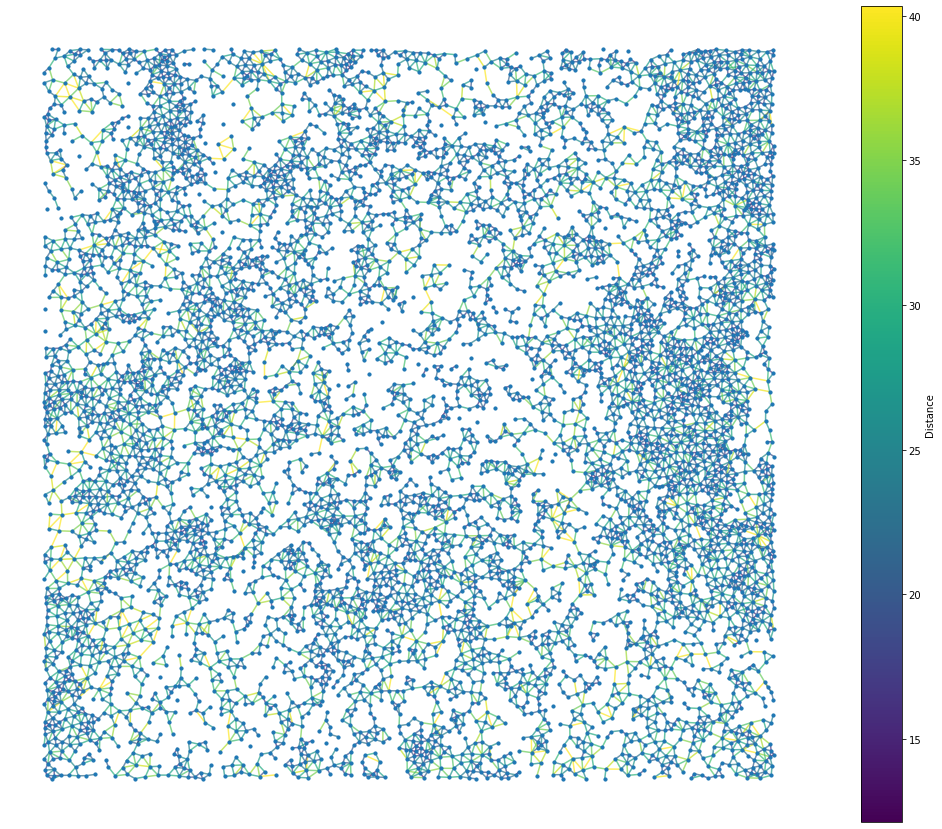

In [41]:
ty.plot_network_distances(coords, pairs, distances, figsize=(18,15), size_nodes=10);
plt.axis('off');

In [30]:
viewer = napari.Viewer()

# make colors for nodes
#                 orange      blue      green
class_colors = ['#ff7f0e', '#1f77b4', '#2ca02c']
classes = [1, 0] # list(obj['tumorYN'].unique())
dico_col = {
    classes[0]:class_colors[0],
    classes[1]:class_colors[1],
}

annotations = ty.make_annotation_dict(
    coords, pairs=pairs,
    nodes_class=exp['tumorYN'],
    nodes_class_color_mapper=dico_col,
)

ty.add_annotations(viewer, annotations)

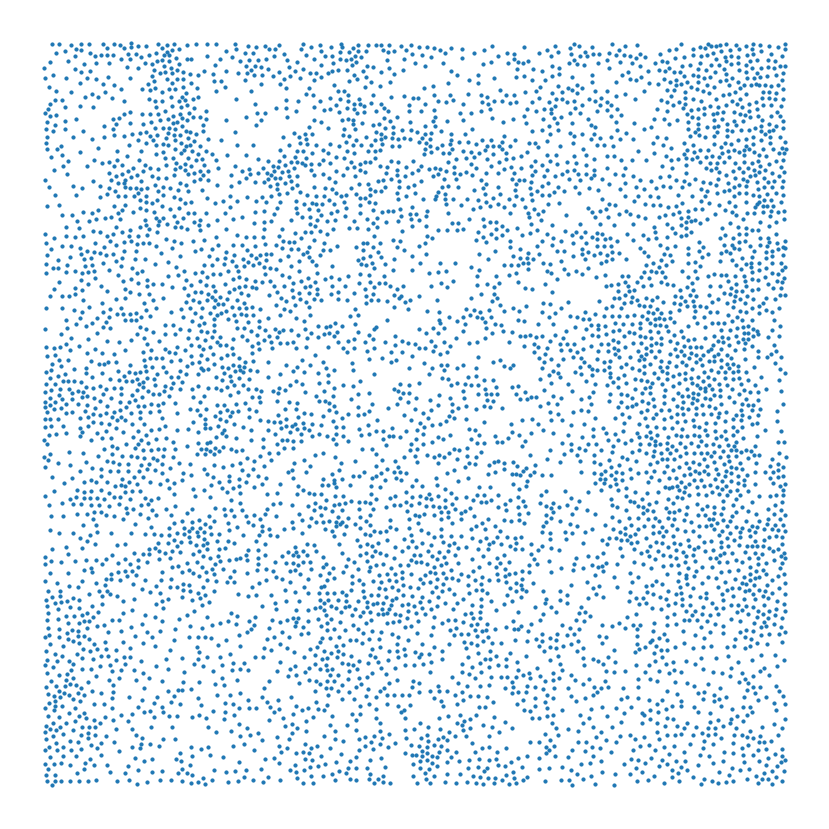

In [32]:
# r=r_med
# r=2

# coords = np.loadtxt(f"../data/intermediate/MIBI-TOF_TNBC/sample-{sample}_coords.csv", delimiter=',')
# pairs = np.loadtxt(f"../data/intermediate/MIBI-TOF_TNBC/sample-{sample}_pairs_contacting-area_r-{r}.csv", delimiter=',', dtype=int)
# ty.plot_network_distances(coords, pairs, distances, figsize=(13,10))
ty.plot_network(coords, pairs, figsize=(15,15), size_nodes=10)
plt.axis('off');

# coords = np.loadtxt(f"../data/intermediate/sample-{sample}_coords.csv")

# for r in [1, 2, r_med, r_med*2]:
    
#     pairs = np.loadtxt(f"../data/intermediate/sample-{sample}_coords_contacting-area_r-{r}.csv", dtye=int)
#     # ty.plot_network_distances(coords, pairs, distances, figsize=(13,10))
#     ty.plot_network(coords, pairs, figsize=(15,15), size_nodes=10)
#     plt.axis('off');

In [38]:
linewidth = 3

In [39]:
fig, ax = ty.showim(color.label2rgb(im, bg_label=0, colors=label_cmap), origin='lower')
ty.plot_network(coords, pairs, col_edges='w', size_nodes=100, ax=ax, linewidth=linewidth)

NameError: name 'label_cmap' is not defined

#### Delaunay triangulation

In [82]:
coords = ty.mask_val_coord(im)
coords = coords.values
pairs = ty.build_delaunay(coords, trim_dist=False)
distances = ty.distance_neighbors(coords, pairs)



In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from pathlib import Path
from time import time
import copy
from skimage import color
import matplotlib as mpl

from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC, LinearSVC
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_validate, GridSearchCV, RandomizedSearchCV
from scipy.stats import loguniform

import umap
# if not installed run: conda install -c conda-forge umap-learn
import hdbscan
from sklearn.cluster import OPTICS, cluster_optics_dbscan

from skimage import io

from scipy.stats import ttest_ind    # Welch's t-test
from scipy.stats import mannwhitneyu # Mann-Whitney rank test
from scipy.stats import ks_2samp     # Kolmogorov-Smirnov statistic

import sys
sys.path.extend([
    '../../tysserand',
    '../../mosna',
])

from tysserand import tysserand as ty
from mosna import mosna

# If need to reload modules after their modification
from importlib import reload
# ty = reload(ty)
# mosna = reload(mosna)
# sns = reload(sns)
# plt = reload(plt)

data_dir = Path("../../Commons/Common_data/MIBI-TOF__Triple_Negative_Breast_Cancer__Angelo_lab/processed_data")
samples_path = data_dir / "patient_class.csv"
objects_path = data_dir / "cellData.csv"
images_path = list(data_dir.glob('*.tiff'))

# relate image paths to sample numbers
import re

img_path_samples = [int(re.search('/processed_data/p(.+?)_labeledcell', str(s)).group(1)) for s in images_path]
pat_img = pd.Series(images_path, index=img_path_samples)

##### Samples data

samples = pd.read_csv(samples_path, index_col=0, header=None, names=['sample', 'response'])

### Objects data

obj = pd.read_csv(objects_path)
common_ids = set(samples.index).intersection(set(obj['SampleID'].unique()))

markers = obj.columns[3:-5]
# avoid control isotopes
markers = [
    'Vimentin', 'SMA', 'B7H3', 'FoxP3', 'Lag3',
    'CD4', 'CD16', 'CD56', 'OX40', 'PD1', 'CD31', 'PD-L1', 'EGFR', 'Ki67',
    'CD209', 'CD11c', 'CD138', 'CD163', 'CD68', 'CSF-1R', 'CD8', 'CD3',
    'IDO', 'Keratin17', 'CD63', 'CD45RO', 'CD20', 'p53', 'Beta catenin',
    'HLA-DR', 'CD11b', 'CD45', 'H3K9ac', 'Pan-Keratin', 'H3K27me3',
    'phospho-S6', 'MPO', 'Keratin6', 'HLA_Class_1',
]

other_cols = [x for x in obj.columns if x not in markers]

def clean_from_presence(im, values, target_val=0):
    """
    Set to a target values elements in im that are
    not present in values
    
    Example:
    >>> im = clean_from_presence(im, values=exp['cellLabelInImage'])
    """
    
    unim = pd.Series(np.unique(im))
    select = ~unim.isin(values)
    val_miss = unim.values[select]
    for i in val_miss:
        im[im == i] = target_val
    return im


processed_dir = Path('../data/processed/MIBI-TOF_TNBC')
save_dir = processed_dir / "all_samples_delaunay_reconstruction"

if not os.path.exists(save_dir):
    os.makedirs(save_dir)

dist_threshold = 50

col_drop = ['SampleID', 'cellLabelInImage']
batch_start = time()
# check that index of coordinates dataframe match 'cellLabelInImage' column
for sample in common_ids:
    print(f"processing sample {sample}")
    
    # ------ Open and pre-process sample image and objects data ------
    im = io.imread(pat_img[sample])
    exp = obj[obj['SampleID'] == sample].copy()
    
    # we don't discard the biggest objects, they are still likely
    # to correspond to cells, and original authors didn't discard them

    # Values in images that are absent in cellLabelInImage were previously detected as background
    im = clean_from_presence(im, values=exp['cellLabelInImage'])
    
    # Save nodes attributes for each sample
    exp.drop(columns=col_drop, inplace=True)
    title = f"sample-{sample}_nodes_attributes"
    exp.to_csv(str(save_dir / title) + '.csv', index=False)
    
    # ------ Delaunay triangulation ------
    # reencode the coordinates to match node positions with their respective areas
    coords = ty.mask_val_coord(im)
    coords = coords.values
    pairs = ty.build_delaunay(coords, trim_dist=False)
    distances = ty.distance_neighbors(coords, pairs)
    
    title = f"sample-{sample}_coords"
    np.savetxt(str(save_dir / title) + '.csv',
               coords, 
               fmt='%.18e', delimiter=',', newline='\n', header='x,y')

    # trim edges with 'percentile_size' method
    trim_dist = ty.find_trim_dist(dist=distances, method='percentile_size', nb_nodes=coords.shape[0])
    
    select = distances < trim_dist
    pairs_selected = pairs[select,:]
    title = f"sample-{sample}_pairs_delaunay_trim-percentile_size-{trim_dist}"
    np.savetxt(str(save_dir / title) + '.csv',
               pairs_selected,
               fmt='%u', delimiter=',', newline='\n', header='source,target')
    ty.plot_network_distances(coords, pairs_selected, distances[select], figsize=(18,15), size_nodes=10);
    plt.axis('off');
    title = f"sample-{sample}_network_delaunay_trim-percentile_size-{trim_dist}"
    plt.savefig(str(save_dir / title) + '.png', bbox_inches='tight', facecolor='white')
    plt.show()
    plt.close()
    
    # trim edges with fixed distance threshold 
    select = distances < dist_threshold
    pairs_selected = pairs[select,:]
    title = f"sample-{sample}_pairs_delaunay_trim-fixed-{dist_threshold}"
    np.savetxt(str(save_dir / title) + '.csv',
               pairs_selected,
               fmt='%u', delimiter=',', newline='\n', header='source,target')
    ty.plot_network_distances(coords, pairs_selected, distances[select], figsize=(18,15), size_nodes=10);
    plt.axis('off');
    title = f"sample-{sample}_network_delaunay_trim-fixed-{dist_threshold}"
    plt.savefig(str(save_dir / title) + '.png', bbox_inches='tight', facecolor='white')
    plt.show()
    plt.close()

batch_end = time()
print(f"batch running time: {batch_end-batch_start}s")
print("-" * 20)
print("-" * 6, " Finished! ", "*" * 6)
print("-" * 20)

In [ ]:
# check that index of coordinates dataframe match 'cellLabelInImage' column
# for sample in samples.index:
#     print(f"processing sample {sample}")
    
#     # ------ Open and pre-process sample image and objects data ------
#     im = io.imread(pat_img[sample])
#     exp = obj[obj['SampleID'] == sample]

#     # Values in images that are absent in cellLabelInImage were previously detected as background
#     im = clean_from_presence(im, values=exp['cellLabelInImage'])
    
#     coords = ty.mask_val_coord(im)
#     ok = np.all(coords.index == exp['cellLabelInImage'])
#     if not ok:
#         break

## Single sample analysis

In [172]:
sample = 3

processed_dir = Path('../data/processed/MIBI-TOF_TNBC')
load_dir = processed_dir / "all_samples_delaunay_reconstruction"

# load image
# im = io.imread(pat_img[sample])
# im = clean_from_presence(im, values=exp['cellLabelInImage'])

# load nodes coordinates
title = f"sample-{sample}_coords"
coords = np.loadtxt(str(load_dir / title) + '.csv', delimiter=',')

# load edges
# the size parameters varies in the filename, we need regular expression to find the file
title = f"sample-{sample}_pairs_delaunay_trim-percentile_size-*.csv"
pairs = np.loadtxt(list(load_dir.glob(title))[0], delimiter=',', dtype='int')

# load nodes attributes (markers quantities, cell classes, ...)
title = f"sample-{sample}_nodes_attributes"
attrib = pd.read_csv(str(load_dir / title) + '.csv')

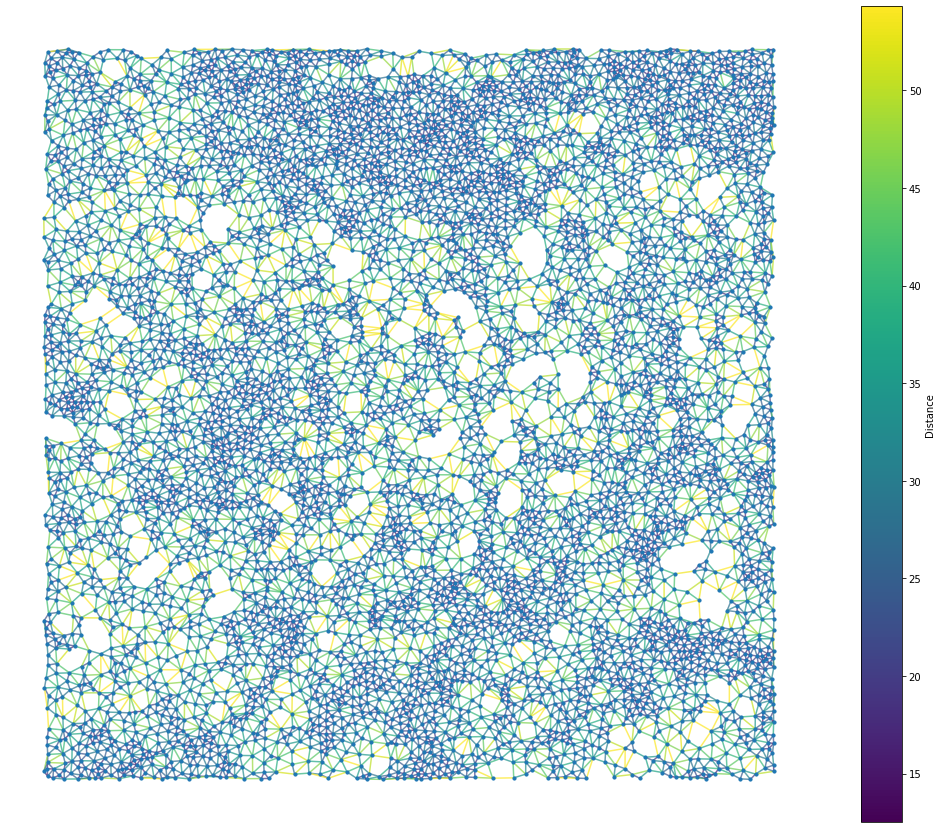

In [72]:
distances = ty.distance_neighbors(coords, pairs)
ty.plot_network_distances(coords, pairs, distances, figsize=(18,15), size_nodes=10);
plt.axis('off');

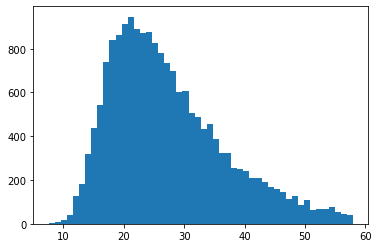

In [74]:
plt.hist(distances, bins=50);

In [173]:
attribute = attrib['Group']
map_att = {
    1: 'Unidentified',
    2: 'Immune',
    3: 'Endothelial',
    4: 'Mesenchymal-like',
    5: 'Tumor',
    6: 'Keratin-positive tumor',
}
attribute = attribute.map(map_att)

In [174]:
attribute.value_counts()

Immune                    3179
Keratin-positive tumor    2249
Mesenchymal-like           735
Endothelial                112
Tumor                       23
Unidentified                17
Name: Group, dtype: int64

In [79]:
processed_dir = Path('../data/processed/MIBI-TOF_TNBC')
save_dir = processed_dir / 'sample-3'
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

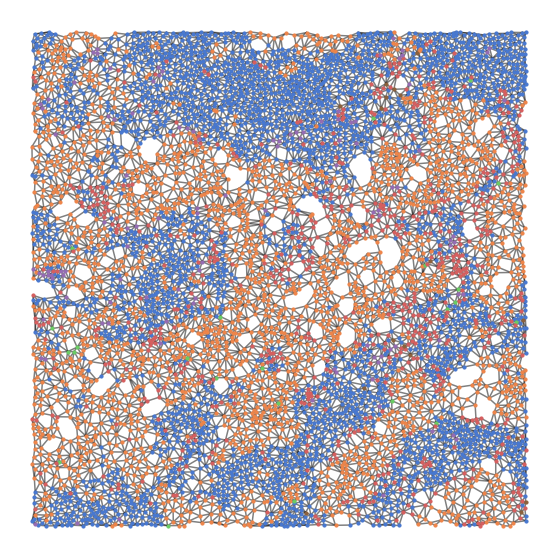

In [ ]:
ty.plot_network(coords, pairs, labels=attribute, legend=False, figsize=(10,10), size_nodes=10);
plt.axis('off');
plt.savefig(save_dir / "network", bbox_inches='tight', facecolor='white')

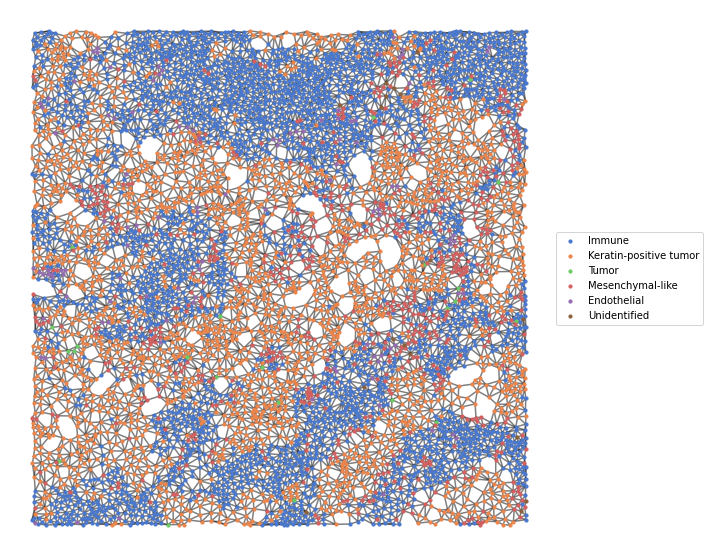

In [82]:
fig, ax = ty.plot_network(coords, pairs, labels=attribute, legend=False, figsize=(12.5,12.5), size_nodes=10);
ax.axis('off');

# put legend outside the axis
# see: https://stackoverflow.com/questions/4700614/how-to-put-the-legend-out-of-the-plot
# Shrink current axis by 20%
box = ax.get_position()
ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
# Put a legend to the right of the current axis
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5));

plt.savefig(save_dir / "network-legend", bbox_inches='tight', facecolor='white')

In [175]:
edges = pd.DataFrame(data=pairs, columns=['source', 'target'])
nodes = pd.DataFrame(data=coords, columns=['x', 'y'])
nodes['Group'] = attribute.values
nodes = nodes.join(pd.get_dummies(nodes['Group']))
att = nodes['Group']
attributes = nodes['Group'].unique()
nodes.head()

,x,y,Group,Endothelial,Immune,Keratin-positive tumor,Mesenchymal-like,Tumor,Unidentified
0,55.196581,34.461538,Immune,0,1,0,0,0,0
1,86.087912,31.340659,Immune,0,1,0,0,0,0
2,122.710280,31.616822,Immune,0,1,0,0,0,0
3,152.205479,34.873288,Immune,0,1,0,0,0,0
4,170.856209,33.640523,Immune,0,1,0,0,0,0


## Merge all samples

We merge nodes coordinates, edges and attributes of all samples to test aggregation statistics, dimensionality reduction and clustering methods across all samples more easily.

In [14]:
processed_dir = Path('../data/processed/MIBI-TOF_TNBC')
load_dir = processed_dir / "all_samples_delaunay_reconstruction"
save_dir = load_dir

In [198]:
sample = common_ids[0]

# load nodes coordinates
title = f"sample-{sample}_coords"
coords_all = np.loadtxt(str(load_dir / title) + '.csv', delimiter=',')
nb_nodes = coords_all.shape[0]

# load edges
# the size parameters varies in the filename, we need regular expression to find the file
title = f"sample-{sample}_pairs_delaunay_trim-percentile_size-*.csv"
pairs_all = np.loadtxt(list(load_dir.glob(title))[0], delimiter=',', dtype='int')

# load nodes attributes (markers quantities, cell classes, ...)
title = f"sample-{sample}_nodes_attributes"
attrib_all = pd.read_csv(str(load_dir / title) + '.csv')

for sample in common_ids[1:]:
    print('processing sample {}'.format(sample))
    
    # load nodes coordinates
    title = f"sample-{sample}_coords"
    coords = np.loadtxt(str(load_dir / title) + '.csv', delimiter=',')
    coords_all = np.vstack([coords_all, coords])

    # load edges
    # the size parameters varies in the filename, we need regular expression to find the file
    title = f"sample-{sample}_pairs_delaunay_trim-percentile_size-*.csv"
    pairs = np.loadtxt(list(load_dir.glob(title))[0], delimiter=',', dtype='int')
    # increase ids in pairs by the number of nodes in all previously loaded networks
    pairs = pairs + nb_nodes
    # update number of nodes for next network
    nb_nodes = coords_all.shape[0]
    pairs_all = np.vstack([pairs_all, pairs])

    # load nodes attributes (markers quantities, cell classes, ...)
    title = f"sample-{sample}_nodes_attributes"
    attrib = pd.read_csv(str(load_dir / title) + '.csv')
    attrib_all = attrib_all.append(attrib, ignore_index=True)

title = f"sample-all_coords"
np.savetxt(str(save_dir / title) + '.csv',
           coords_all, 
           fmt='%.18e', delimiter=',', newline='\n', header='x,y')

title = f"sample-all_pairs_delaunay_trim-percentile_size"
np.savetxt(str(save_dir / title) + '.csv',
           pairs_all,
           fmt='%u', delimiter=',', newline='\n', header='source,target')

title = f"sample-all_nodes_attributes"
attrib_all.to_csv(str(save_dir / title) + '.csv', index=False)

processing sample 2
processing sample 3
processing sample 4
processing sample 5
processing sample 6
processing sample 7
processing sample 8
processing sample 9
processing sample 10
processing sample 11
processing sample 12
processing sample 13
processing sample 14
processing sample 15
processing sample 16
processing sample 17
processing sample 18
processing sample 19
processing sample 20
processing sample 21
processing sample 22
processing sample 23
processing sample 24
processing sample 25
processing sample 26
processing sample 27
processing sample 28
processing sample 29
processing sample 31
processing sample 32
processing sample 33
processing sample 34
processing sample 35
processing sample 36
processing sample 37
processing sample 38
processing sample 39
processing sample 40
processing sample 41


In [15]:
# Uncomment to load already merged data
# load nodes coordinates of all samples
title = f"sample-all_coords"
coords_all = np.loadtxt(str(load_dir / title) + '.csv', delimiter=',')

# load edges of all samples
title = f"sample-all_pairs_delaunay_trim-percentile_size"
pairs_all = np.loadtxt(str(load_dir / title) + '.csv', delimiter=',', dtype='int')

# load nodes attributes (markers quantities, cell classes, ...) of all samples
title = f"sample-all_nodes_attributes"
attrib_all = pd.read_csv(str(load_dir / title) + '.csv')

In [16]:
map_att = {
    1: 'Unidentified',
    2: 'Immune',
    3: 'Endothelial',
    4: 'Mesenchymal-like',
    5: 'Tumor',
    6: 'Keratin-positive tumor',
}
attribute = attrib_all['Group']
attribute = attribute.map(map_att)

# we add attributes to nodes to color network figures
edges_all = pd.DataFrame(data=pairs_all, columns=['source', 'target'])
nodes_all = pd.DataFrame(data=coords_all, columns=['x', 'y'])
nodes_all['Group'] = attribute.values
nodes_all = nodes_all.join(pd.get_dummies(attribute))
# att = nodes['Group']
attribute_uniq = nodes_all['Group'].unique()
nodes_all.head()

,x,y,Group,Endothelial,Immune,Keratin-positive tumor,Mesenchymal-like,Tumor,Unidentified
0,158.335616,32.856164,Keratin-positive tumor,0,0,1,0,0,0
1,191.294118,30.588235,Immune,0,1,0,0,0,0
2,212.325581,30.232558,Keratin-positive tumor,0,0,1,0,0,0
3,269.985782,34.772512,Keratin-positive tumor,0,0,1,0,0,0
4,381.175141,35.344633,Immune,0,1,0,0,0,0


In [17]:
attribute.value_counts()

Keratin-positive tumor    99487
Immune                    83043
Mesenchymal-like           8170
Tumor                      3167
Endothelial                2086
Unidentified               1725
Name: Group, dtype: int64

### NAS

In [18]:
X = attrib_all[markers].values

#### First order neighbors, mean and std

In [213]:
var_aggreg = mosna.aggregate_k_neighbors(
    X=X,
    pairs=pairs,
    order=1,
    var_names=markers,
)

In [216]:
var_aggreg.to_csv(save_dir / 'nas_samples-all_stat-mean-std_on_markers.csv', index=False)

In [19]:
# Uncomment to load already computed NAS
var_aggreg = pd.read_csv(save_dir / 'nas_samples-all_stat-mean-std_on_markers.csv')

In [54]:
# For the visualization
marker = '.'
size_points = 10

In [20]:
reducer = umap.UMAP(random_state=0)
embedding = reducer.fit_transform(var_aggreg)
embedding.shape

(197678, 2)

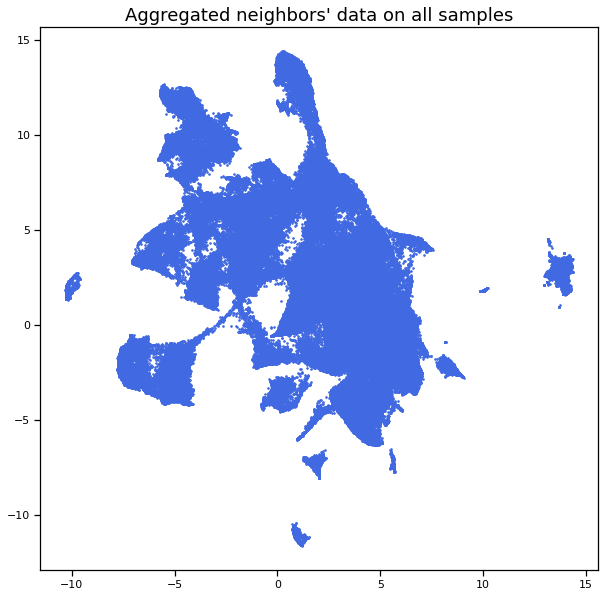

In [219]:
plt.figure(figsize=[10,10])
plt.scatter(embedding[:, 0], embedding[:, 1], c='royalblue', marker=marker, s=size_points)
title = "Aggregated neighbors' data on all samples"
plt.title(title, fontsize=18);
# plt.savefig('../data/processed/'+title, bbox_inches='tight')

In [ ]:
# It doesn't work
# import mpl_scatter_density

# fig = plt.figure()
# ax = fig.add_subplot(1, 1, 1, projection='scatter_density')
# density = ax.scatter_density(embedding[:, 0], embedding[:, 1], c='royalblue')
# fig.colorbar(density, label='Number of points per pixel')

/home/alexis/.pyenv/versions/miniconda3-latest/envs/mosna/lib/python3.8/site-packages/mpl_scatter_density/generic_density_artist.py:77: RuntimeWarning: All-NaN slice encountered
  vmin = self._density_vmin(array)
/home/alexis/.pyenv/versions/miniconda3-latest/envs/mosna/lib/python3.8/site-packages/mpl_scatter_density/generic_density_artist.py:82: RuntimeWarning: All-NaN slice encountered
  vmax = self._density_vmax(array)


In [227]:
# import napari
# viewer = napari.Viewer()
# annotations = ty.make_annotation_dict(coords=embedding)
# annotations['nodes_size'] = 1
# viewer.add_points(
#     annotations['nodes_coords'],
#     )

In [ ]:
min_cluster_size = 100

if SOFT_CLUST:
    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1, prediction_data=True, core_dist_n_jobs=1)
    clusterer.fit(embedding)
    soft_clusters = hdbscan.all_points_membership_vectors(clusterer)
    labels_hdbs = soft_clusters.argmax(axis=1)
else:
    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1, prediction_data=True)
    labels_hdbs = clusterer.labels_
nb_clust_hdbs = labels_hdbs.max() + 1
print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")
hdbs_cmap = mosna.make_cluster_cmap(labels_hdbs)

In [ ]:
sns.set_context('notebook')
plt.figure(figsize=[10,10])
plt.scatter(embedding[:, 0],
            embedding[:, 1],
            c=labels_hdbs,
            s=5,
            cmap=hdbs_cmap);

title = "HDBSCAN clustering on aggregated neighbors' data"
plt.title(title, fontsize=18);
# plt.savefig('../data/processed/'+title, bbox_inches='tight')

In [ ]:
class_id, class_count = np.unique(labels_hdbs, return_counts=True)
plt.bar(class_id, class_count, width=0.8);
plt.title('Clusters histogram');

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from pathlib import Path
from time import time
import copy
from skimage import color
import matplotlib as mpl

import umap
# if not installed run: conda install -c conda-forge umap-learn
import hdbscan

import sys
sys.path.extend([
    '../../tysserand',
    '../../mosna',
])

from tysserand import tysserand as ty
from mosna import mosna

RUN_SCREEN = True
SOFT_CLUST = True
sample = 3
downsample = False
# orders = [1, 2, 3]
orders = [1]

processed_dir = Path('../data/processed/MIBI-TOF_TNBC')
aggreg_dir = processed_dir / "all_samples_delaunay_reconstruction"
save_dir = processed_dir / "dim_reduc_clustering_screening_nas_samples-all_stat-mean-std_on_markers_downsample-10"

data_dir = Path("../../Commons/Common_data/MIBI-TOF__Triple_Negative_Breast_Cancer__Angelo_lab/processed_data")
objects_path = data_dir / "cellData.csv"
sample_ids = pd.read_csv(objects_path, usecols=['SampleID'])

coords_dir = processed_dir / "all_samples_reconstruction_parameters"
title = f"sample-{sample}_coords"
coords = np.loadtxt(str(coords_dir / title) + '.csv', delimiter=',')
nodes = pd.DataFrame(data=coords, columns=['x', 'y'])

if not os.path.exists(save_dir):
    os.makedirs(save_dir)

select_sample_nodown = sample_ids.values == sample
sample_ids = sample_ids.loc[::downsample]
select_sample = sample_ids.values == sample
select_nodes = select_sample[select_sample_nodown]
nodes = nodes.loc[select_nodes, :]

if RUN_SCREEN:
    for order in orders:
        print("order: {}".format(order))
        # compute statistics on aggregated data across neighbors
#         var_aggreg = mosna.aggregate_k_neighbors(X=X, pairs=pairs, order=order, var_names=markers)
        var_aggreg = pd.read_csv(aggreg_dir / 'nas_samples-all_stat-mean-std_on_markers.csv')
        var_aggreg = var_aggreg.loc[::downsample, :]

        # Dimension reduction for visualization
        embed_viz = umap.UMAP(n_components=2, random_state=0).fit_transform(var_aggreg)

        for dim_clust in [2,3,4,5,6,7,8,9]:
            print("    dim_clust: {}".format(dim_clust))
            # Dimension reduction for clustering
            embed_clust = umap.UMAP(n_neighbors=30,
                                    min_dist=0.0,
                                    n_components=dim_clust,
                                    random_state=0,
                                   ).fit_transform(var_aggreg)
            
            title = f"umap_sample-all_nas-mean-std_order-{order}_dim_clust-{dim_clust}"
            np.savetxt(str(save_dir / title) + '.csv',
                       embed_clust, 
                       fmt='%.18e', delimiter=',', newline='\n')

#             for min_cluster_size in [10,20,30,40,50,60,70,80,90,100]:
            for min_cluster_size in [50, 100, 150, 200, 300, 400, 500]:
                print("        min_cluster_size: {}".format(min_cluster_size), end=', ')
                # Clustering
                if SOFT_CLUST:
                    clusterer = hdbscan.HDBSCAN(
                        metric='euclidean', 
                        min_cluster_size=min_cluster_size, 
                        min_samples=1, 
                        prediction_data=True, 
                        core_dist_n_jobs=-1,
                    )
                    clusterer.fit(embed_clust)
                    soft_clusters = hdbscan.all_points_membership_vectors(clusterer)
                    labels_hdbs = soft_clusters.argmax(axis=1)
                else:
                    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1)
                    clusterer.fit(embed_clust)
                    labels_hdbs = clusterer.labels_
                nb_clust_hdbs = labels_hdbs.max() # + 1
                print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")
                
                title = f"hdbscan_clustering_sample-all_nas-mean-std_order-{order}_dim_clust-{dim_clust}_min_cluster_size-{min_cluster_size}"
                np.savetxt(str(save_dir / title) + '.csv',
                           labels_hdbs, 
                           fmt='%.18e', delimiter=',', newline='\n')

                hdbs_cmap = mosna.make_cluster_cmap(labels_hdbs)

    #             # Histogram of classes
    #             fig = plt.figure()
    #             class_id, class_count = np.unique(labels_hdbs, return_counts=True)
    #             plt.bar(class_id, class_count, width=0.8);
    #             plt.title('Clusters histogram');
    #             title = f"Clusters histogram - nb_var {nb_var} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}"
    #             plt.savefig(str(save_dir / title) + '.png', bbox_inches='tight')
    #             plt.show()            

                # Big summary plot
                fig, ax = plt.subplots(1, 3, figsize=(22,7), tight_layout=False)

#                 ty.plot_network(coords, pairs, labels=nodes['Group'], legend=False, size_nodes=size_points, ax=ax[0])
#                 ax[0].set_title('Spatial map of phenotypes for omics data', fontsize=14);

                ax[0].scatter(nodes.loc[:,'x'], nodes.loc[:,'y'], c=labels_hdbs[select_sample], cmap=hdbs_cmap, marker=marker, s=size_points)
                ax[0].set_title('Spatial map of detected areas on sample {}'.format(sample), fontsize=14);
                ax[0].set_aspect('equal')
            
                ax[1].scatter(embed_viz[select_sample, 0], embed_viz[select_sample, 1], c=labels_hdbs[select_sample], s=5, cmap=hdbs_cmap);
                ax[1].set_title("HDBSCAN clustering on NAS of sample {}".format(sample), fontsize=14);
                ax[1].set_aspect('equal')

                ax[2].scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_hdbs, s=5, cmap=hdbs_cmap);
                ax[2].set_title("HDBSCAN clustering on NAS of all samples", fontsize=14);
                ax[2].set_aspect('equal')

                suptitle = f"Spatial omics data and detected areas - mean and std - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}";
                fig.suptitle(suptitle, fontsize=18)

                fig.savefig(save_dir / suptitle, bbox_inches='tight')
                plt.show()

Run HDBSCAN on one sample only

In [49]:
sample = 3
downsample = False
orders = [1]

processed_dir = Path('../data/processed/MIBI-TOF_TNBC')
aggreg_dir = processed_dir / "all_samples_delaunay_reconstruction"
save_dir = processed_dir / "dim_reduc_clustering_screening_nas_samples-all_stat-mean-std_on_markers_downsample-10"

data_dir = Path("../../Commons/Common_data/MIBI-TOF__Triple_Negative_Breast_Cancer__Angelo_lab/processed_data")
objects_path = data_dir / "cellData.csv"
sample_ids = pd.read_csv(objects_path, usecols=['SampleID'])
sample_ids = sample_ids[sample_ids <= 41]

coords_dir = processed_dir / "all_samples_reconstruction_parameters"
title = f"sample-{sample}_coords"
coords = np.loadtxt(str(coords_dir / title) + '.csv', delimiter=',')
nodes = pd.DataFrame(data=coords, columns=['x', 'y'])

if not os.path.exists(save_dir):
    os.makedirs(save_dir)

if downsample:
    select_sample_nodown = sample_ids.values == sample
    select_sample_nodown = select_sample_nodown.ravel()
    sample_ids = sample_ids.loc[::downsample]
    select_sample = sample_ids.values == sample
    select_sample = select_sample.ravel()
    select_nodes = select_sample[select_sample_nodown]
    nodes = nodes.loc[select_nodes, :]
else:
    select_sample = sample_ids.values == sample
    select_sample = select_sample.ravel()


if RUN_SCREEN:
    for order in orders:
        print("order: {}".format(order))
        # compute statistics on aggregated data across neighbors
#         var_aggreg = mosna.aggregate_k_neighbors(X=X, pairs=pairs, order=order, var_names=markers)
        var_aggreg = pd.read_csv(aggreg_dir / 'nas_samples-all_stat-mean-std_on_markers.csv')
        if downsample:
            var_aggreg = var_aggreg.loc[::downsample, :]

        # Dimension reduction for visualization
        title = f"umap_sample-all_nas-mean-std_order-{order}_dim_clust-2"
        embed_viz = np.loadtxt(str(save_dir / title) + '.csv', delimiter=',')

        for dim_clust in [2,3,4,5,6,7,8,9]:
            print("    dim_clust: {}".format(dim_clust))
            # Dimension reduction for clustering
            title = f"umap_sample-all_nas-mean-std_order-{order}_dim_clust-{dim_clust}"
            embed_clust = np.loadtxt(str(save_dir / title) + '.csv', delimiter=',')

            for min_cluster_size in [10,20,30,40,50,60,70,80,90,100]:
#             for min_cluster_size in [50, 100, 150, 200, 300, 400, 500]:
                print("        min_cluster_size: {}".format(min_cluster_size), end=', ')
                # Clustering
                if SOFT_CLUST:
                    clusterer = hdbscan.HDBSCAN(
                        metric='euclidean', 
                        min_cluster_size=min_cluster_size, 
                        min_samples=1, 
                        prediction_data=True, 
                        core_dist_n_jobs=-1,
                    )
                    clusterer.fit(embed_clust[select_sample, :])
                    soft_clusters = hdbscan.all_points_membership_vectors(clusterer)
                    labels_hdbs = soft_clusters.argmax(axis=1)
                else:
                    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1)
                    clusterer.fit(embed_clust[select_sample, :])
                    labels_hdbs = clusterer.labels_
                nb_clust_hdbs = labels_hdbs.max() # + 1
                print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")
                
                title = f"hdbscan_clustering_sample-{sample}_nas-mean-std_order-{order}_dim_clust-{dim_clust}_min_cluster_size-{min_cluster_size}"
                np.savetxt(str(save_dir / title) + '.csv',
                           labels_hdbs, 
                           fmt='%.18e', delimiter=',', newline='\n')

                hdbs_cmap = mosna.make_cluster_cmap(labels_hdbs)

    #             # Histogram of classes
    #             fig = plt.figure()
    #             class_id, class_count = np.unique(labels_hdbs, return_counts=True)
    #             plt.bar(class_id, class_count, width=0.8);
    #             plt.title('Clusters histogram');
    #             title = f"Clusters histogram - nb_var {nb_var} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}"
    #             plt.savefig(str(save_dir / title) + '.png', bbox_inches='tight')
    #             plt.show()            

                # Big summary plot
                fig, ax = plt.subplots(1, 3, figsize=(22,7), tight_layout=False)

#                 ty.plot_network(coords, pairs, labels=nodes['Group'], legend=False, size_nodes=size_points, ax=ax[0])
#                 ax[0].set_title('Spatial map of phenotypes for omics data', fontsize=14);

                ax[0].scatter(nodes.loc[:,'x'], nodes.loc[:,'y'], c=labels_hdbs, cmap=hdbs_cmap, marker=marker, s=size_points)
                ax[0].set_title('Spatial map of detected areas on sample {}'.format(sample), fontsize=14);
                ax[0].set_aspect('equal')
            
                ax[1].scatter(embed_viz[select_sample, 0], embed_viz[select_sample, 1], c=labels_hdbs[select_sample], s=5, cmap=hdbs_cmap);
                ax[1].set_title("HDBSCAN clustering on NAS of sample {}".format(sample), fontsize=14);
                ax[1].set_aspect('equal')

                ax[2].scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_hdbs, s=5, cmap=hdbs_cmap);
                ax[2].set_title("HDBSCAN clustering on NAS of all samples", fontsize=14);
                ax[2].set_aspect('equal')

                suptitle = f"Spatial omics data and detected areas - mean and std - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}";
                fig.suptitle(suptitle, fontsize=18)

                fig.savefig(save_dir / suptitle, bbox_inches='tight')
                plt.show()

order: 1
    dim_clust: 2
        min_cluster_size: 10, 

IndexError: boolean index did not match indexed array along dimension 0; dimension is 197678 but corresponding boolean dimension is 201656

## Simpler methods: PCA and HC

In [18]:
from sklearn.decomposition import PCA

# For the visualization
marker = '.'
size_points = 10

RUN_SCREEN = True
SOFT_CLUST = True
order = 1
sample = 3
downsample = 10
# orders = [1, 2, 3]
orders = [1]

processed_dir = Path('../data/processed/MIBI-TOF_TNBC')
aggreg_dir = processed_dir / "all_samples_delaunay_reconstruction"
save_dir = processed_dir / "dim_reduc_clustering_screening_nas_samples-all_stat-mean-std_on_markers_downsample-10"

data_dir = Path("../../Commons/Common_data/MIBI-TOF__Triple_Negative_Breast_Cancer__Angelo_lab/processed_data")
objects_path = data_dir / "cellData.csv"
sample_ids = pd.read_csv(objects_path, usecols=['SampleID'])

coords_dir = processed_dir / "all_samples_reconstruction_parameters"
title = f"sample-{sample}_coords"
coords = np.loadtxt(str(coords_dir / title) + '.csv', delimiter=',')
nodes = pd.DataFrame(data=coords, columns=['x', 'y'])

if not os.path.exists(save_dir):
    os.makedirs(save_dir)


select_sample = sample_ids.values == sample

# compute statistics on aggregated data across neighbors
# var_aggreg = mosna.aggregate_k_neighbors(X=X, pairs=pairs, order=order, var_names=markers)
var_aggreg = pd.read_csv(aggreg_dir / 'nas_samples-all_stat-mean-std_on_markers.csv')


# PCA
pca = PCA(n_components=2)
pca.fit(var_aggreg.values)

PCA(n_components=2)

In [19]:
pca.explained_variance_ratio_

array([0.15546396, 0.07061121])

In [20]:
pca.singular_values_

array([1075.72309114,  724.97403432])

In [21]:
embedding = pca.transform(var_aggreg.values)

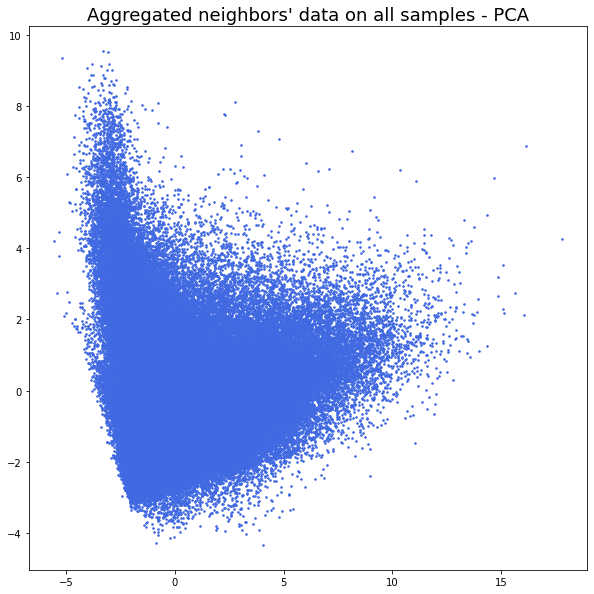

In [22]:
plt.figure(figsize=[10,10])
plt.scatter(embedding[:, 0], embedding[:, 1], c='royalblue', marker=marker, s=size_points)
title = "Aggregated neighbors' data on all samples - PCA"
plt.title(title, fontsize=18);

Text(0.5, 1.0, 'Cumulative variance explained')

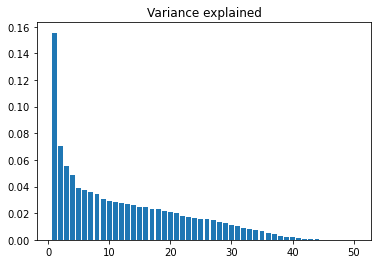

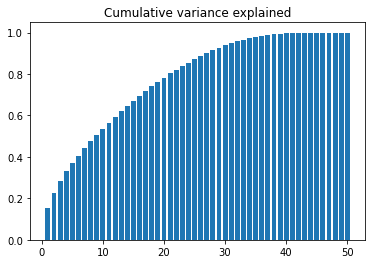

In [31]:
pca = PCA(n_components=50)
pca.fit(var_aggreg.values)

plt.figure()
plt.bar(np.arange(pca.explained_variance_ratio_.size) + 1, pca.explained_variance_ratio_)
plt.title('Variance explained')

plt.figure()
cum_sum_var_exp = np.cumsum(pca.explained_variance_ratio_)
plt.bar(np.arange(cum_sum_var_exp.size) + 1, cum_sum_var_exp)
plt.title('Cumulative variance explained')

Text(0.5, 1.0, 'Cumulative variance explained')

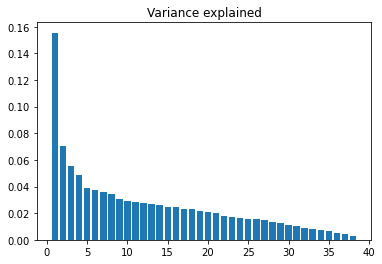

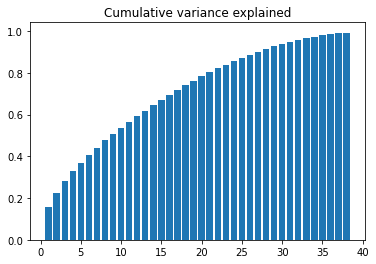

In [33]:
dim_clust = 38
pca = PCA(n_components=dim_clust)
pca.fit(var_aggreg.values)
X = pca.transform(var_aggreg.values)


plt.figure()
plt.bar(np.arange(pca.explained_variance_ratio_.size) + 1, pca.explained_variance_ratio_)
plt.title('Variance explained')

plt.figure()
cum_sum_var_exp = np.cumsum(pca.explained_variance_ratio_)
plt.bar(np.arange(cum_sum_var_exp.size) + 1, cum_sum_var_exp)
plt.title('Cumulative variance explained')

For n_clusters = 2 The average silhouette_score is : 0.26165969287378815


NameError: name 'cm' is not defined

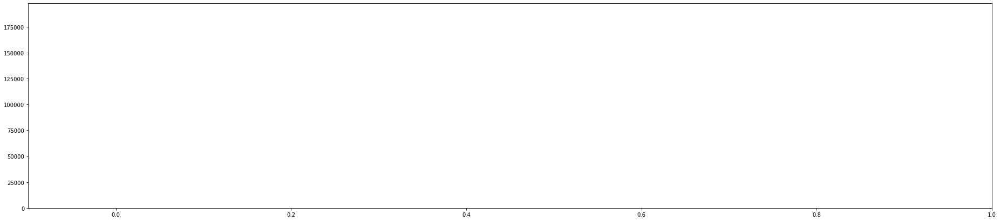

In [34]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

range_n_clusters = [2, 3, 4, 5, 6, 7, 8, 9, 10]

for n_clusters in range_n_clusters:
    # Create a subplot with 1 row and 2 columns
    fig, ax = plt.subplots()
    fig.set_size_inches(32, 7)

    # The 1st subplot is the silhouette plot
    # The silhouette coefficient can range from -1, 1 but in this example all
    # lie within [-0.1, 1]
    ax.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax.set_ylim([0, len(X) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=0)
    cluster_labels = clusterer.fit_predict(X)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(X, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax.set_title("The silhouette plot for the various clusters.")
    ax.set_xlabel("The silhouette coefficient values")
    ax.set_ylabel("Cluster label")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

#### First order neighbors, mean only

In [222]:
cols = [x for x in var_aggreg.columns if x.endswith(' mean')]
pca = PCA(n_components=2)
pca.fit(X)

## Assortativity

In [84]:
# Network statistics
mixmat = mosna.mixing_matrix(nodes, edges, attributes)
assort = mosna.attribute_ac(mixmat)

# ------ Randomization ------
mixmat_rand, assort_rand = mosna.randomized_mixmat(nodes, edges, attributes, n_shuffle=500, parallel=False)
mixmat_mean, mixmat_std, mixmat_zscore = mosna.zscore(mixmat, mixmat_rand, return_stats=True)
assort_mean, assort_std, assort_zscore = mosna.zscore(assort, assort_rand, return_stats=True)

randomization: 100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 500/500 [00:46<00:00, 10.73it/s]


In [85]:
mixmat = mosna.mixmat_to_df(mixmat, attributes)
mixmat_zscore = mosna.mixmat_to_df(mixmat_zscore, attributes)

Assortativity by cell types: 0.5267710596614604
Z-scored assortativity by cell types: 90.71378475380672


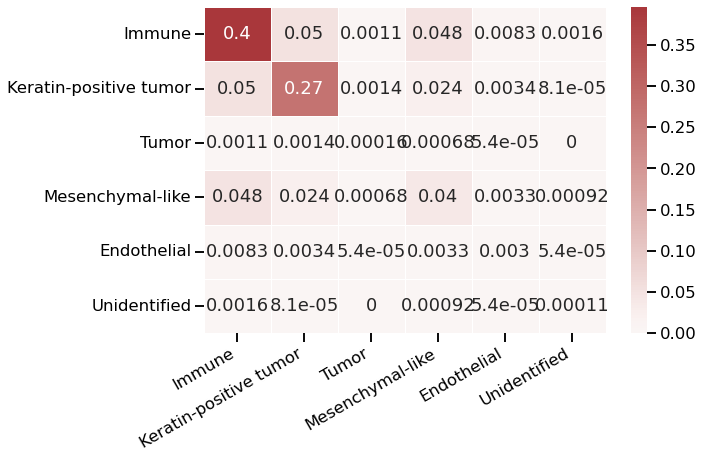

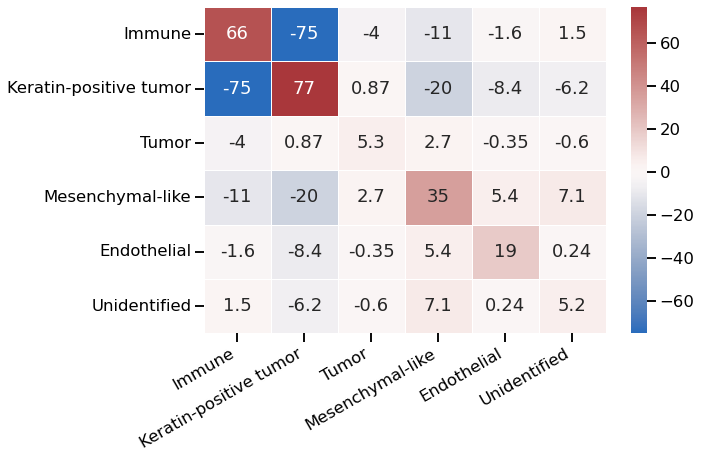

In [90]:
sns.set_context('talk')

title = "Assortativity by cell types: {f.:2}".format(assort)
print(title)
f, ax = plt.subplots(figsize=(9, 6))
sns.heatmap(mixmat, center=0, cmap="vlag", annot=True, linewidths=.5, ax=ax)
ax.set_title("
plt.xticks(rotation=30, ha='right');
# plt.xticks(rotation=30, ha='right', fontsize=20);
# plt.yticks(fontsize=20);
plt.savefig(save_dir / "assortativity", bbox_inches='tight', facecolor='white')

print("Z-scored assortativity by cell types: {}".format(assort_zscore))
f, ax = plt.subplots(figsize=(9, 6))
sns.heatmap(mixmat_zscore, center=0, cmap="vlag", annot=True, linewidths=.5, ax=ax)
plt.xticks(rotation=30, ha='right');
plt.savefig(save_dir / "assortativity_z-scored", bbox_inches='tight', facecolor='white')

## NAS analysis

In [91]:
SOFT_CLUST = True

In [169]:
X = attrib[markers].values

#### First order neighbors

In [176]:
var_aggreg = mosna.aggregate_k_neighbors(
    X=X,
    pairs=pairs,
    order=1,
    var_names=markers,
    stat_funcs=[np.mean],
    stat_names=['mean'],
)

In [177]:
# For the visualization
marker = 'o'
size_points = 10

In [178]:
reducer = umap.UMAP(random_state=0)
embedding = reducer.fit_transform(var_aggreg)
embedding.shape

(6315, 2)

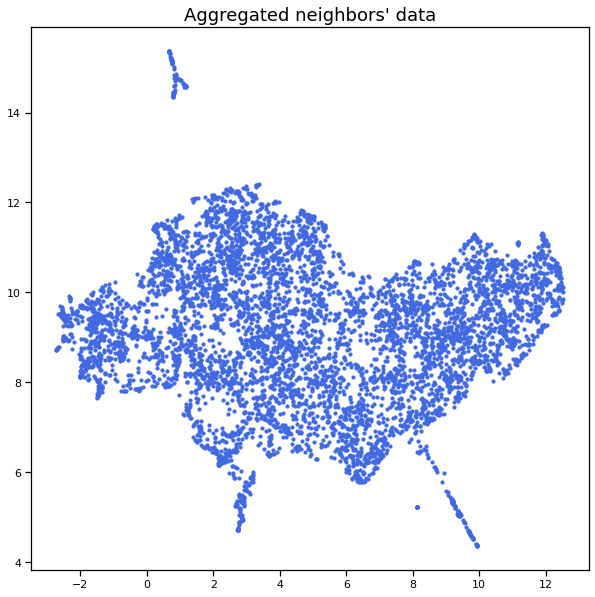

In [179]:
plt.figure(figsize=[10,10])
plt.scatter(embedding[:, 0], embedding[:, 1], c='royalblue', marker=marker, s=size_points)
title = "Aggregated neighbors' data"
plt.title(title, fontsize=18);
# plt.savefig('../data/processed/'+title, bbox_inches='tight')

In [180]:
min_cluster_size = 19

if SOFT_CLUST:
    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1, prediction_data=True)
    clusterer.fit(embedding)
    soft_clusters = hdbscan.all_points_membership_vectors(clusterer)
    labels_hdbs = soft_clusters.argmax(axis=1)
else:
    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1, prediction_data=True)
    labels_hdbs = clusterer.labels_
nb_clust_hdbs = labels_hdbs.max() + 1
print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")
hdbs_cmap = mosna.make_cluster_cmap(labels_hdbs)

HDBSCAN has detected 2 clusters


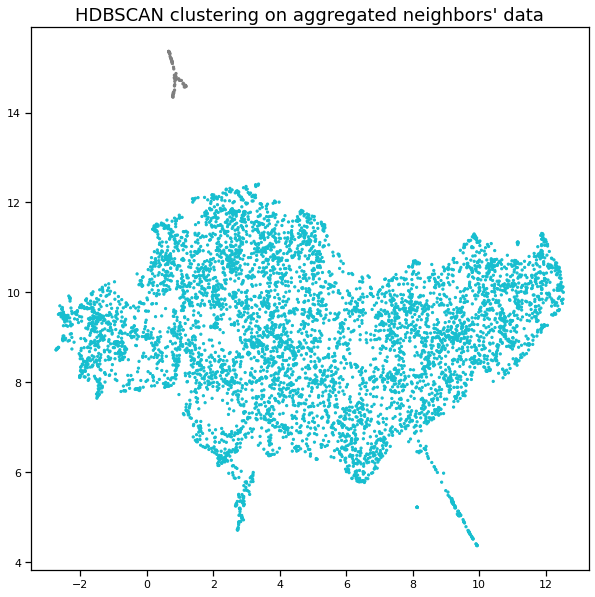

In [181]:
sns.set_context('notebook')
plt.figure(figsize=[10,10])
plt.scatter(embedding[:, 0],
            embedding[:, 1],
            c=labels_hdbs,
            s=5,
            cmap=hdbs_cmap);

title = "HDBSCAN clustering on aggregated neighbors' data"
plt.title(title, fontsize=18);
# plt.savefig('../data/processed/'+title, bbox_inches='tight')

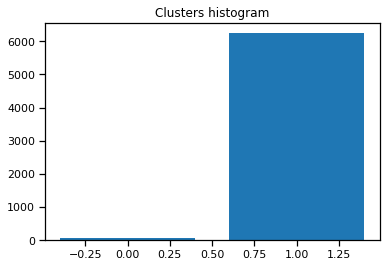

In [182]:
class_id, class_count = np.unique(labels_hdbs, return_counts=True)
plt.bar(class_id, class_count, width=0.8);
plt.title('Clusters histogram');

#### Visualisation of spatial omics data and detected areas 

No handles with labels found to put in legend.


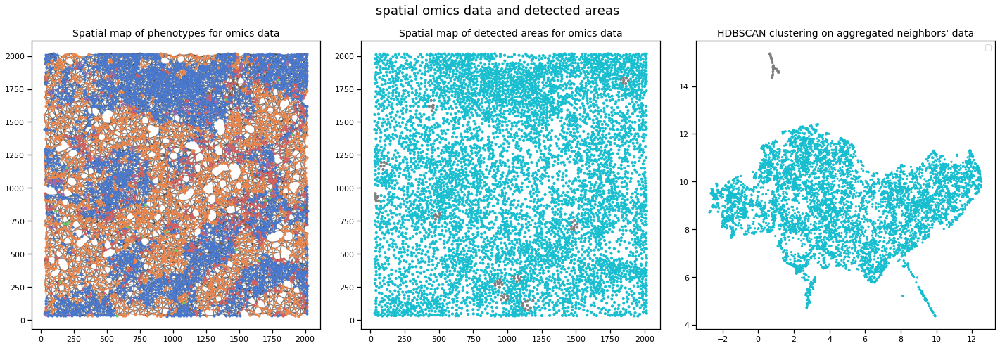

In [183]:
fig, ax = plt.subplots(1, 3, figsize=(20,7), tight_layout=True)

ty.plot_network(coords, pairs, labels=nodes['Group'], size_nodes=size_points, ax=ax[0])
ax[0].set_title('Spatial map of phenotypes for omics data', fontsize=14);

ax[1].scatter(nodes.loc[:,'x'], nodes.loc[:,'y'], c=labels_hdbs, cmap=hdbs_cmap, marker=marker, s=size_points)
ax[1].set_title('Spatial map of detected areas for omics data', fontsize=14);

ax[2].scatter(embedding[:, 0], embedding[:, 1], c=labels_hdbs, s=5, cmap=hdbs_cmap);
ax[2].set_title("HDBSCAN clustering on aggregated neighbors' data", fontsize=14);

title = "spatial omics data and detected areas"
fig.suptitle(title, fontsize=18);

### Screen parameters

In [ ]:
RUN_SCREEN = True

nb_var = X.shape[1]
save_dir = Path(f'../data/processed/MIBI-TOF_TNBC/nb_var {nb_var}')
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

orders = [1, 2, 3]

if RUN_SCREEN:
    for order in orders:
        # compute statistics on aggregated data across neighbors
        var_aggreg = mosna.aggregate_k_neighbors(X=X, pairs=pairs, order=order, var_names=markers)

        # Dimension reduction for visualization
        embed_viz = umap.UMAP(n_components=2, random_state=0).fit_transform(var_aggreg)

        for dim_clust in [4,5,6,7,8,9]:
            # Dimension reduction for clustering
            embed_clust = umap.UMAP(n_neighbors=30,
                                    min_dist=0.0,
                                    n_components=dim_clust,
                                    random_state=0,
                                   ).fit_transform(var_aggreg)

#             for min_cluster_size in [10,20,30,40,50,60,70,80,90,100]:
            for min_cluster_size in [40,50,60,70,80,90]:
                # Clustering
                if SOFT_CLUST:
                    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1, prediction_data=True)
                    clusterer.fit(embed_clust)
                    soft_clusters = hdbscan.all_points_membership_vectors(clusterer)
                    labels_hdbs = soft_clusters.argmax(axis=1)
                else:
                    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1)
                    clusterer.fit(embed_clust)
                    labels_hdbs = clusterer.labels_
                nb_clust_hdbs = labels_hdbs.max() + 1
                print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")
                hdbs_cmap = mosna.make_cluster_cmap(labels_hdbs)

    #             # Histogram of classes
    #             fig = plt.figure()
    #             class_id, class_count = np.unique(labels_hdbs, return_counts=True)
    #             plt.bar(class_id, class_count, width=0.8);
    #             plt.title('Clusters histogram');
    #             title = f"Clusters histogram - nb_var {nb_var} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}"
    #             plt.savefig(str(save_dir / title) + '.png', bbox_inches='tight')
    #             plt.show()            

                # Big summary plot
                fig, ax = plt.subplots(1, 3, figsize=(22,7), tight_layout=False)

    #             ty.plot_network(coords, pairs, labels=nodes['Group'], legend=False, size_nodes=size_points, ax=ax[0])
    #             ax[0].set_title('Spatial map of phenotypes for omics data', fontsize=14);

                ax[1].scatter(nodes.loc[:,'x'], nodes.loc[:,'y'], c=labels_hdbs, cmap=hdbs_cmap, marker=marker, s=size_points)
                ax[1].set_title('Spatial map of detected areas for omics data', fontsize=14);
                ax[1].set_aspect('equal')

                ax[2].scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_hdbs, s=5, cmap=hdbs_cmap);
#                 ax[2].set_title("HDBSCAN clustering on aggregated neighbors' data", fontsize=14);
    #             ax[2].set_aspect('equal')

                suptitle = f"Spatial omics data and detected areas - nb_var {nb_var} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}";
                fig.suptitle(suptitle, fontsize=18)

                fig.savefig(save_dir / suptitle, bbox_inches='tight')
                plt.show()

In [75]:
# For the visualization
marker = 'o'
size_points = 10

order = 2
dim_clust = 9
min_cluster_size = 90
nb_var = X.shape[1]

# compute statistics on aggregated data across neighbors
var_aggreg = mosna.aggregate_k_neighbors(X=X, pairs=pairs, order=order, var_names=markers)

# Dimension reduction for visualization
embed_viz = umap.UMAP(n_components=2, random_state=0).fit_transform(var_aggreg)


# Dimension reduction for clustering
embed_clust = umap.UMAP(n_neighbors=30,
                        min_dist=0.0,
                        n_components=dim_clust,
                        random_state=0,
                       ).fit_transform(var_aggreg)

# Clustering
if SOFT_CLUST:
    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1, prediction_data=True)
    clusterer.fit(embed_clust)
    soft_clusters = hdbscan.all_points_membership_vectors(clusterer)
    labels_hdbs = soft_clusters.argmax(axis=1)
else:
    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1)
    clusterer.fit(embed_clust)
    labels_hdbs = clusterer.labels_

hdbs_cmap = mosna.make_cluster_cmap(labels_hdbs)
nb_clust_hdbs = labels_hdbs.max() + 1
print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")

HDBSCAN has detected 6 clusters


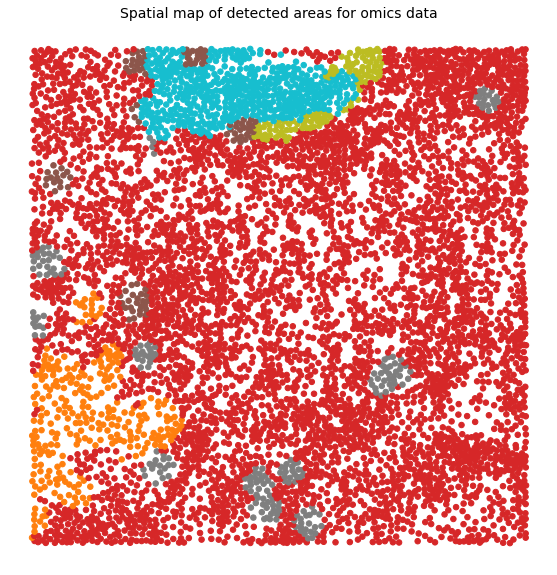

In [76]:
fig, ax = plt.subplots(figsize=(17,10))
ax.scatter(nodes.loc[:,'x'], nodes.loc[:,'y'], c=labels_hdbs, cmap=hdbs_cmap, marker=marker, s=30)
ax.set_title('Spatial map of detected areas for omics data', fontsize=14);
ax.set_aspect('equal')
ax.set_axis_off()

fname = f"Spatial map of detected areas for omics data - nb_var {nb_var} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}";
# fig.suptitle(suptitle, fontsize=18)
fig.savefig(save_dir / fname, bbox_inches='tight', facecolor='white')

In [ ]:
# # Histogram of classes
# fig = plt.figure()
# class_id, class_count = np.unique(labels_hdbs, return_counts=True)
# plt.bar(class_id, class_count, width=0.8);
# plt.title('Clusters histogram');

fig, ax = plt.subplots(1, 3, figsize=(22,7), tight_layout=False)

ty.plot_network(coords, pairs, labels=nodes['Group'], legend=False, size_nodes=size_points, ax=ax[0])
ax[0].set_title('Spatial map of phenotypes for omics data', fontsize=14);
ax[0].set_axis_off()

ax[1].scatter(nodes.loc[:,'x'], nodes.loc[:,'y'], c=labels_hdbs, cmap=hdbs_cmap, marker=marker, s=size_points)
ax[1].set_title('Spatial map of detected areas for omics data', fontsize=14);
ax[1].set_aspect('equal')
ax[1].set_axis_off()

ax[2].scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_hdbs, s=5, cmap=hdbs_cmap);
ax[2].set_title("HDBSCAN clustering on aggregated neighbors' data", fontsize=14);
ax[1].set_aspect('equal')
ax[2].set_axis_off()

suptitle = f"Spatial omics data and detected areas - nb_var {nb_var} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}";
fig.suptitle(suptitle, fontsize=18)

In [ ]:
fig, ax = plt.subplots(figsize=(15,10))
ax.scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_hdbs, s=35, cmap=hdbs_cmap);
ax.set_title("HDBSCAN clustering on aggregated neighbors' data", fontsize=14);
ax.set_aspect('equal')
ax.set_axis_off()

fname = f"HDBSCAN clustering on aggregated neighbors' data - nb_var {nb_var} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}";
# fig.suptitle(suptitle, fontsize=18)
fig.savefig(save_dir / fname, bbox_inches='tight', facecolor='white')

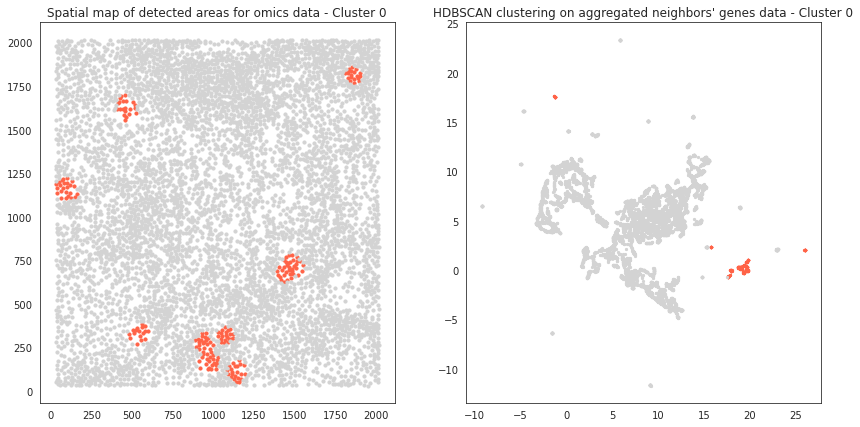

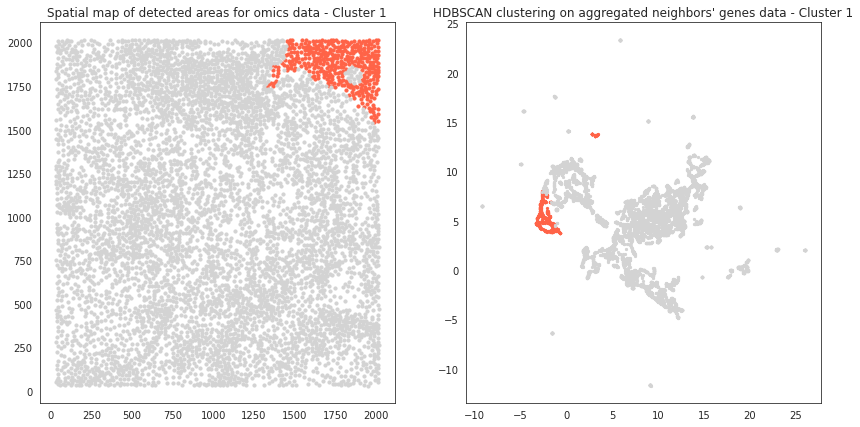

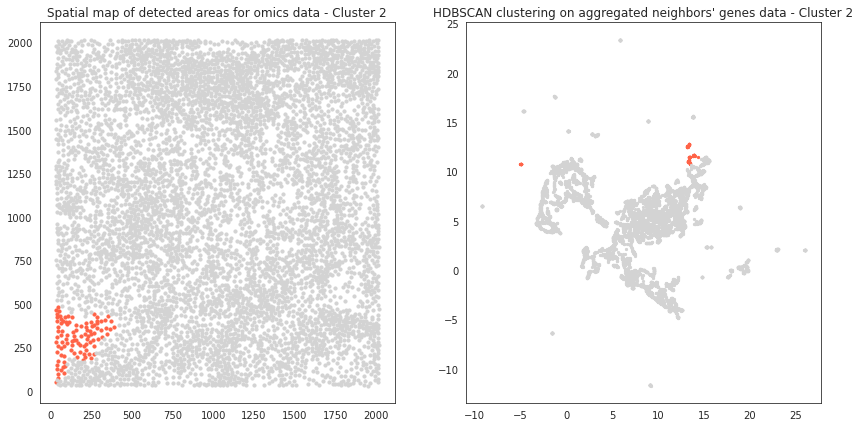

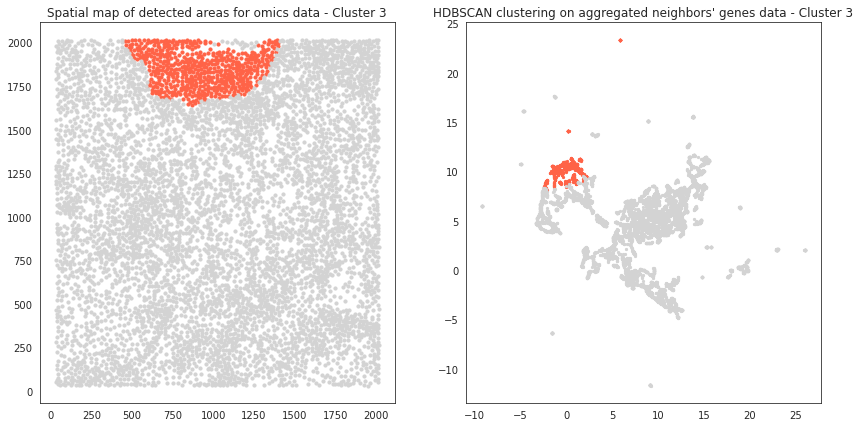

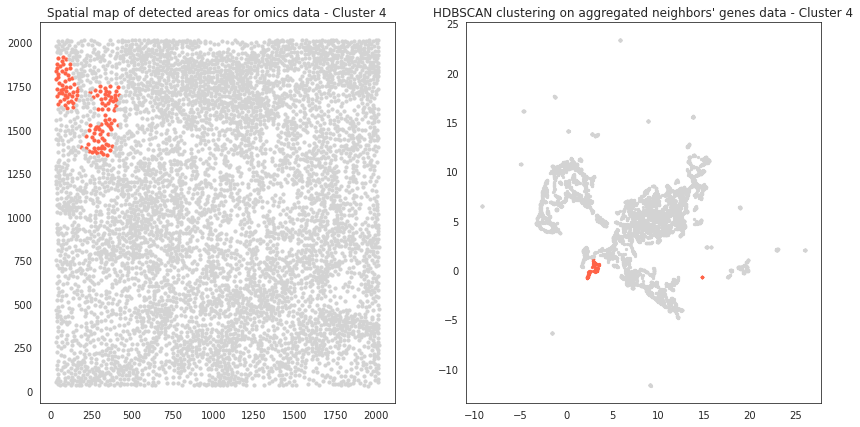

...

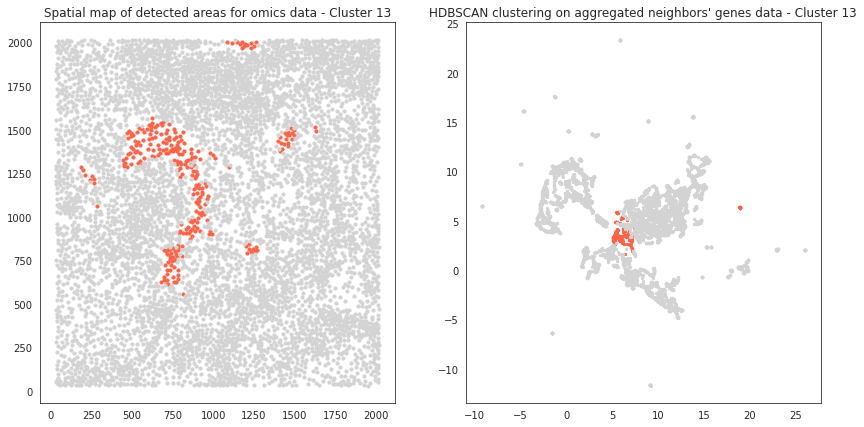

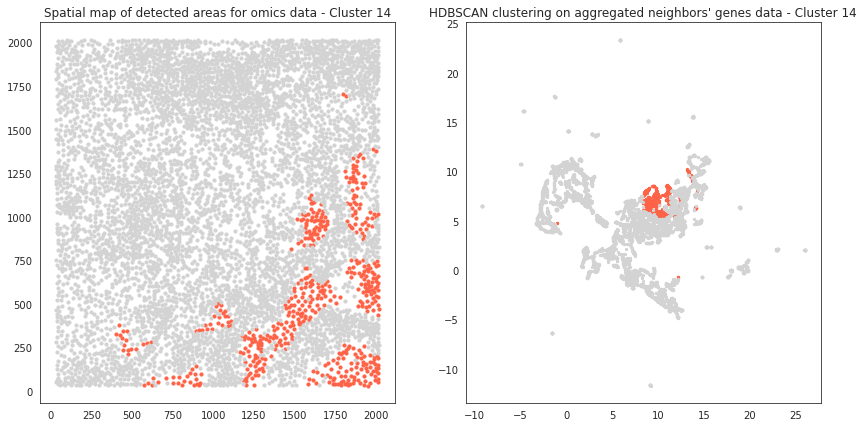

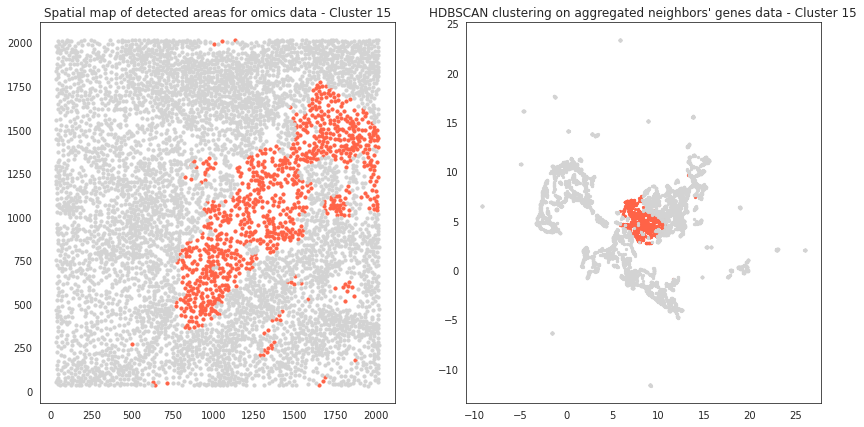

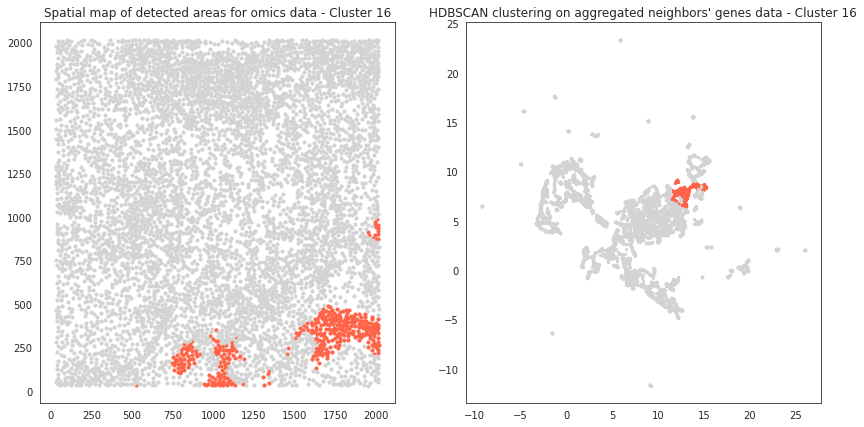

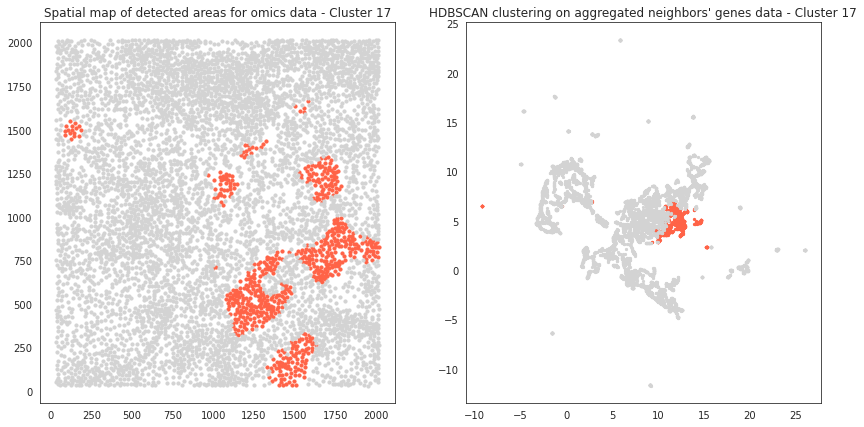

In [266]:
for clust_id in np.unique(labels_hdbs):
    clust_targ = labels_hdbs == clust_id  # cluster of interest (target)
    clust_comp = labels_hdbs != clust_id  # cluster(s) we compare with

    fig, ax = plt.subplots(1, 2, figsize=(14,7), tight_layout=False)

    ax[0].scatter(nodes.loc[clust_targ,'x'], nodes.loc[clust_targ,'y'], c='tomato', marker=marker, s=size_points)
    ax[0].scatter(nodes.loc[clust_comp,'x'], nodes.loc[clust_comp,'y'], c='lightgrey', marker=marker, s=size_points)
    ax[0].set_title('Spatial map of detected areas for omics data - Cluster '+str(clust_id), fontsize=12);
    
    ax[1].scatter(embed_viz[clust_targ, 0], embed_viz[clust_targ, 1], s=5, c='tomato');
    ax[1].scatter(embed_viz[clust_comp, 0], embed_viz[clust_comp, 1], s=5, c='lightgrey');
    ax[1].set_title("HDBSCAN clustering on aggregated neighbors' genes data - Cluster "+str(clust_id), fontsize=12);
    plt.show()

#### Manual DE analysis

In [ ]:
var_names = var_aggreg.columns
distrib_pval = {
    'Welch': [],
#     'Mann-Whitney': [],
    'Kolmogorov-Smirnov': [],
}
# target group of interest
GROUP_TGT = 16
# group of reference
GROUP_REF = 17
# GROUP_TGT = 16
# GROUP_REF = 11

select_1 = labels_hdbs == GROUP_TGT
select_2 = labels_hdbs == GROUP_REF
# save for latter phenotype subtraction
select_1_orig = copy.deepcopy(select_1)
select_2_orig = copy.deepcopy(select_2)

for var_name in var_names:
    dist1 = var_aggreg.loc[select_1, var_name]
    dist2 = var_aggreg.loc[select_2, var_name]
    w_stat, w_pval = ttest_ind(dist1, dist2, equal_var=False)
#     mwu_stat, mwu_pval = mannwhitneyu(dist1, dist2)
    ks_stat, ks_pval = ks_2samp(dist1, dist2)
    distrib_pval['Welch'].append(w_pval)
#     distrib_pval['Mann-Whitney'].append(mwu_pval)
    distrib_pval['Kolmogorov-Smirnov'].append(ks_pval)
DE_pval = pd.DataFrame(distrib_pval, index=var_names)

In [ ]:
def highlight_under(s, thresh=0.05, color='darkorange'):
    '''
    highlight values that are under a threshold
    '''
    is_under = s <= thresh
    attr = 'background-color: {}'.format(color)
    return [attr if v else '' for v in is_under]

In [ ]:
DE_pval.T.style.apply(highlight_under)

In [ ]:
diff_var = DE_pval.loc[DE_pval['Kolmogorov-Smirnov'] <= 0.05, 'Kolmogorov-Smirnov'].sort_values()
diff_var

In [182]:
import scanpy as sc

ModuleNotFoundError: No module named 'scanpy'

In [130]:
adata = sc.AnnData(var_aggreg)
adata.obs['cell_clusters'] = pd.Series([str(x) for  x in labels_hdbs], dtype="category").values
# adata.obs['cell_clusters'] = labels_hdbs

NameError: name 'sc' is not defined

In [ ]:
sc.tl.rank_genes_groups(adata, groupby='cell_clusters', method='t-test')
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)

In [ ]:
sc.tl.rank_genes_groups(adata, 'cell_clusters', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)

In [ ]:
sc.tl.rank_genes_groups(adata, 'cell_clusters', method='logreg')
sc.pl.rank_genes_groups(adata, n_genes=15, sharey=False)

Compare to a single cluster.

In [ ]:
sc.tl.rank_genes_groups(adata, 'cell_clusters', groups=[str(GROUP_TGT)], reference=str(GROUP_REF), method='wilcoxon')
sc.pl.rank_genes_groups(adata, groups=[str(GROUP_TGT)], n_genes=15)

In [ ]:
# error
# sc.pl.rank_genes_groups_violin(adata, groups=['1'], n_genes=8)

In [ ]:
diff_var = DE_pval.loc[DE_pval['Kolmogorov-Smirnov'] <= 0.05, 'Kolmogorov-Smirnov'].sort_values()
var_names = diff_var.iloc[:20].index

select_1 = labels_hdbs == GROUP_TGT
select_2 = labels_hdbs == GROUP_REF

dist1 = var_aggreg.loc[select_1, var_names]
dist2 = var_aggreg.loc[select_2, var_names]
dist1['cluster'] = GROUP_TGT
dist2['cluster'] = GROUP_REF
dist1['cell id'] = dist1.index
dist2['cell id'] = dist2.index

In [ ]:
wide = dist1.append(dist2)

In [ ]:
long = pd.melt(wide, id_vars=['cell id', 'cluster'], value_vars=var_names)

In [ ]:
sns.set_style("white")
plt.figure(figsize=(20, 6))
ax = sns.violinplot(x="variable", y="value", hue="cluster",
                    data=long, palette="Set2", split=True)
plt.xticks(rotation=30, ha='right', fontsize=20);
plt.yticks(fontsize=20);
title = 'omics - DE {} vs {}'.format(GROUP_TGT, GROUP_REF)
plt.savefig(imdir.joinpath(title), bbox_inches='tight')

In [ ]:
plt.figure(figsize=(20, 6))
ax = sns.violinplot(x="variable", y="value", hue="cluster",
                    data=long, palette="Set2", split=True,
                    inner="stick")
plt.xticks(rotation=30, ha='right', fontsize=20);
plt.yticks(fontsize=20);
title = 'omics - DE {} vs {} sticks'.format(GROUP_TGT, GROUP_REF)
plt.savefig(imdir.joinpath(title), bbox_inches='tight')

In [ ]:

# target group of interest
GROUP_TGT = 16
# group of reference
GROUP_REF = 17
# GROUP_TGT = 16
# GROUP_REF = 11

select_1 = labels_hdbs == GROUP_TGT
select_2 = labels_hdbs == GROUP_REF

c1 = attribute[select_1].value_counts(normalize=True)
c2 = attribute[select_2].value_counts(normalize=True)
c1.name = GROUP_TGT
c2.name = GROUP_REF
counts = pd.merge(c1, c2, right_index = True, left_index = True) 

import seaborn as sns
cm = sns.light_palette("green", as_cmap=True)
s = counts.style.background_gradient(cmap=cm, axis=None)
s

In [ ]:
mean_1 = dist1.loc[:,var_names].mean(axis=0)
mean_2 = dist2.loc[:,var_names].mean(axis=0)
ratio = mean_1 / mean_2
ratio.rename('ratio', inplace=True)

In [ ]:
DE = DE_pval.join(ratio)
DE['logFC'] = np.log(DE['ratio'])
DE['-log10Pvalue'] = -np.log10(DE['Mann-Whitney'])
DE['significant'] = DE['Mann-Whitney'] < 0.05
DE

In [ ]:
ax = sns.relplot(x="ratio", y="-log10Pvalue", hue="significant",
            sizes=(40, 400), alpha=.5, palette="muted",
            height=6, data=DE)

In [ ]:
# To annotate points, but there are nan due to negative values in log
# for index, row in DE.loc[DE['significant'], ['logFC', '-log10Pvalue']].iterrows():
# #     plt.annotate('actual group', xy=(x+0.2,y))
#     print(row['logFC'])

## DE markers

#### Immune vs Mesenchymal-like

In [145]:
attributes

array(['Immune', 'Keratin-positive tumor', 'Tumor', 'Mesenchymal-like',
       'Endothelial', 'Unidentified'], dtype=object)

In [199]:
var_names = markers
distrib_pval = {
    'Welch': [],
#     'Mann-Whitney': [],
    'Kolmogorov-Smirnov': [],
}
# target group of interest
GROUP_TGT = 'Immune'
# group of reference
GROUP_REF = 'Mesenchymal-like'

select_1 = attribute == GROUP_TGT
if GROUP_REF == 'other':
    select_2 = attribute != GROUP_TGT
else:
    select_2 = attribute == GROUP_REF
select_1 = select_1.values
select_2 = select_2.values
for var_name in var_names:
    dist1 = exp.loc[select_1, var_name]
    dist2 = exp.loc[select_2, var_name]
    w_stat, w_pval = ttest_ind(dist1, dist2, equal_var=False)
#     mwu_stat, mwu_pval = mannwhitneyu(dist1, dist2)
    ks_stat, ks_pval = ks_2samp(dist1, dist2)
    distrib_pval['Welch'].append(w_pval)
#     distrib_pval['Mann-Whitney'].append(mwu_pval)
    distrib_pval['Kolmogorov-Smirnov'].append(ks_pval)
DE_pval = pd.DataFrame(distrib_pval, index=var_names)

In [200]:
DE_pval.T.style.apply(highlight_under)

,C,Na,Si,P,Ca,Fe,dsDNA,Vimentin,SMA,Background,B7H3,FoxP3,Lag3,CD4,CD16,CD56,OX40,PD1,CD31,PD-L1,EGFR,Ki67,CD209,CD11c,CD138,CD163,CD68,CSF-1R,CD8,CD3,IDO,Keratin17,CD63,CD45RO,CD20,p53,Beta catenin,HLA-DR,CD11b,CD45,H3K9ac,Pan-Keratin,H3K27me3,phospho-S6,MPO,Keratin6,HLA_Class_1,Ta,Au
Welch,nan,0.000000,0.521559,0.000000,0.007116,0.000001,0.004933,0.299781,0.000000,0.000000,1.000000,0.000010,0.026122,0.000000,0.000000,0.002820,0.004214,0.000000,0.000000,0.000000,0.000000,0.000014,0.842966,0.000000,0.000001,0.317640,0.000000,0.000000,0.000000,0.000000,0.000000,0.089809,0.002074,0.000000,0.000000,0.104769,0.000000,0.000000,0.314406,0.000000,0.000000,0.000000,0.000000,0.000000,0.000010,0.000000,0.000000,0.356005,0.859060
Kolmogorov-Smirnov,1.000000,0.000000,0.000001,0.000000,0.000000,0.000000,0.096100,0.002916,0.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.092164,0.777978,0.832930,0.686285,0.984403,0.999881,0.000000,0.313139,1.000000,0.000000,0.063662,0.000000,0.000000,0.758041,1.000000,0.146137,0.000000,0.000000,1.000000,0.000000,0.000000,0.702094,0.000000,0.000000,0.000000,0.000000,0.000000,0.998287,0.000000,0.000000,0.000015,0.018799


In [201]:
diff_var = DE_pval.loc[DE_pval['Kolmogorov-Smirnov'] <= 0.05, 'Kolmogorov-Smirnov'].sort_values()
diff_var

Na              1.332268e-15
HLA_Class_1     1.332268e-15
phospho-S6      1.332268e-15
H3K27me3        1.332268e-15
CD45            1.332268e-15
HLA-DR          1.332268e-15
Beta catenin    1.332268e-15
CD20            1.332268e-15
CD45RO          1.332268e-15
CD8             1.332268e-15
CD68            1.332268e-15
CD3             1.332268e-15
CD16            1.332268e-15
CD4             1.332268e-15
SMA             1.332268e-15
P               1.332268e-15
CD11c           1.332268e-15
H3K9ac          1.997291e-13
Ca              5.231371e-13
Background      1.709802e-10
Pan-Keratin     1.288951e-08
Fe              5.458434e-08
Keratin6        1.821645e-07
Si              5.686155e-07
Ta              1.528934e-05
Vimentin        2.916255e-03
Au              1.879916e-02
Name: Kolmogorov-Smirnov, dtype: float64

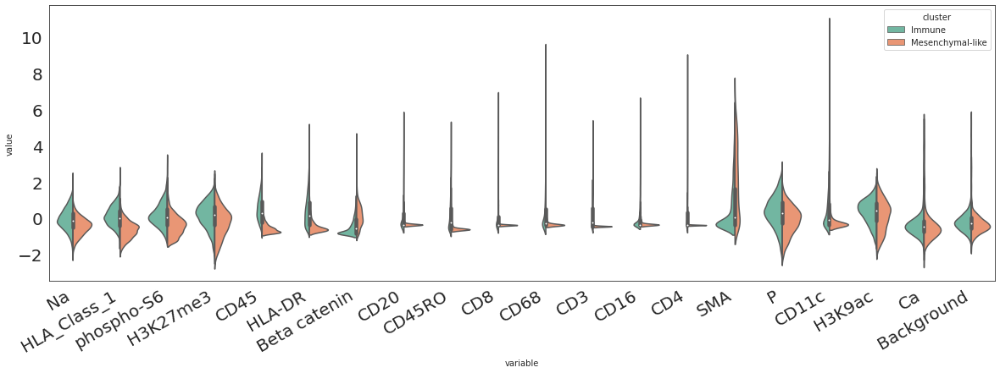

In [202]:
diff_var = DE_pval.loc[DE_pval['Kolmogorov-Smirnov'] <= 0.05, 'Kolmogorov-Smirnov'].sort_values()
var_names = diff_var.iloc[:20].index

dist1 = exp.loc[select_1, var_names]
dist2 = exp.loc[select_2, var_names]
dist1['cluster'] = GROUP_TGT
dist2['cluster'] = GROUP_REF
dist1['cell id'] = dist1.index
dist2['cell id'] = dist2.index

wide = dist1.append(dist2)
long = pd.melt(wide, id_vars=['cell id', 'cluster'], value_vars=var_names)

sns.set_style("white")
plt.figure(figsize=(20, 6))
ax = sns.violinplot(x="variable", y="value", hue="cluster",
                    data=long, palette="Set2", split=True)
plt.xticks(rotation=30, ha='right', fontsize=20);
plt.yticks(fontsize=20);
title = 'omics - DE {} vs {}'.format(GROUP_TGT, GROUP_REF)
plt.savefig(imdir.joinpath(title), bbox_inches='tight')

In [203]:
# plt.figure(figsize=(20, 6))
# ax = sns.violinplot(x="variable", y="value", hue="cluster",
#                     data=long, palette="Set2", split=True,
#                     inner="stick")
# plt.xticks(rotation=30, ha='right', fontsize=20);
# plt.yticks(fontsize=20);
# title = 'omics - DE {} vs {} sticks'.format(GROUP_TGT, GROUP_REF)
# plt.savefig(imdir.joinpath(title), bbox_inches='tight')

In [204]:
mean_1 = dist1.loc[:,var_names].mean(axis=0)
mean_2 = dist2.loc[:,var_names].mean(axis=0)
ratio = mean_1 / mean_2
ratio.rename('ratio', inplace=True)

Na              0.065603
HLA_Class_1    -0.252093
phospho-S6     -0.527527
H3K27me3       -0.745604
CD45           -1.129199
HLA-DR         -1.339464
Beta catenin   -2.490367
CD20           -1.058700
CD45RO         -0.535789
CD8            -0.644207
CD68           -1.649596
CD3            -0.728076
CD16            0.223108
CD4            -0.759715
SMA             0.274396
P              -3.273311
CD11c          -3.685409
H3K9ac          3.121548
Ca              0.746066
Background      0.574393
Name: ratio, dtype: float64

#### Immune vs other

In [205]:
var_names = markers
distrib_pval = {
    'Welch': [],
#     'Mann-Whitney': [],
    'Kolmogorov-Smirnov': [],
}
# target group of interest
GROUP_TGT = 'Immune'
# group of reference
GROUP_REF = 'other'

select_1 = attribute == GROUP_TGT
if GROUP_REF == 'other':
    select_2 = attribute != GROUP_TGT
else:
    select_2 = attribute == GROUP_REF
select_1 = select_1.values
select_2 = select_2.values
for var_name in var_names:
    dist1 = exp.loc[select_1, var_name]
    dist2 = exp.loc[select_2, var_name]
    w_stat, w_pval = ttest_ind(dist1, dist2, equal_var=False)
#     mwu_stat, mwu_pval = mannwhitneyu(dist1, dist2)
    ks_stat, ks_pval = ks_2samp(dist1, dist2)
    distrib_pval['Welch'].append(w_pval)
#     distrib_pval['Mann-Whitney'].append(mwu_pval)
    distrib_pval['Kolmogorov-Smirnov'].append(ks_pval)
DE_pval = pd.DataFrame(distrib_pval, index=var_names)

In [206]:
DE_pval.T.style.apply(highlight_under)

,C,Na,Si,P,Ca,Fe,dsDNA,Vimentin,SMA,Background,B7H3,FoxP3,Lag3,CD4,CD16,CD56,OX40,PD1,CD31,PD-L1,EGFR,Ki67,CD209,CD11c,CD138,CD163,CD68,CSF-1R,CD8,CD3,IDO,Keratin17,CD63,CD45RO,CD20,p53,Beta catenin,HLA-DR,CD11b,CD45,H3K9ac,Pan-Keratin,H3K27me3,phospho-S6,MPO,Keratin6,HLA_Class_1,Ta,Au
Welch,nan,0.000000,0.000010,0.000000,0.651530,0.000000,0.000229,0.000000,0.000000,0.000000,1.000000,0.000010,0.026710,0.000000,0.000000,0.000783,0.000301,0.000000,0.000220,0.000000,0.000035,0.463134,0.001276,0.000000,0.000000,0.262259,0.000000,0.000000,0.000000,0.000000,0.000000,0.001009,0.000004,0.000000,0.000000,0.137817,0.000000,0.000000,0.139107,0.000000,0.000000,0.000000,0.000000,0.000000,0.000005,0.000000,0.000000,0.000000,0.000000
Kolmogorov-Smirnov,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.001042,0.000000,0.000000,0.000000,1.000000,0.999995,1.000000,0.000000,0.000000,1.000000,0.994880,0.000476,0.483097,0.013731,0.059161,0.995916,0.956093,0.000000,0.000000,1.000000,0.000000,0.000143,0.000000,0.000000,0.164613,0.999002,0.459859,0.000000,0.000000,1.000000,0.000000,0.000000,0.113824,0.000000,0.000000,0.000000,0.000000,0.000000,0.764434,0.000000,0.000000,0.000000,0.000000


In [207]:
diff_var = DE_pval.loc[DE_pval['Kolmogorov-Smirnov'] <= 0.05, 'Kolmogorov-Smirnov'].sort_values()
diff_var

HLA_Class_1      0.000000e+00
Keratin6         0.000000e+00
Pan-Keratin      0.000000e+00
CD45             0.000000e+00
HLA-DR           0.000000e+00
Vimentin         0.000000e+00
Beta catenin     0.000000e+00
CD45RO           0.000000e+00
CD4              0.000000e+00
CD3              0.000000e+00
CD11c            0.000000e+00
Na              2.011519e-302
CD68            1.865868e-295
CD8             6.082668e-278
CD20            8.327518e-256
CD138           5.551652e-237
H3K9ac          5.136362e-208
P               2.380211e-189
Ta              1.108647e-110
CD16             7.289820e-98
Background       5.240176e-59
H3K27me3         2.120206e-53
Fe               3.253932e-49
Au               6.547793e-44
Ca               4.144498e-31
phospho-S6       1.070045e-27
Si               6.116663e-19
SMA              1.130395e-09
CSF-1R           1.425915e-04
PD1              4.758465e-04
dsDNA            1.041520e-03
PD-L1            1.373103e-02
Name: Kolmogorov-Smirnov, dtype: float64

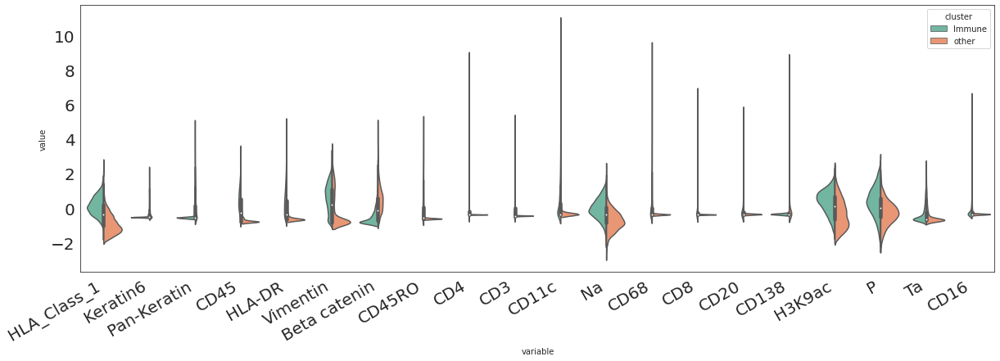

In [208]:
diff_var = DE_pval.loc[DE_pval['Kolmogorov-Smirnov'] <= 0.05, 'Kolmogorov-Smirnov'].sort_values()
var_names = diff_var.iloc[:20].index

dist1 = exp.loc[select_1, var_names]
dist2 = exp.loc[select_2, var_names]
dist1['cluster'] = GROUP_TGT
dist2['cluster'] = GROUP_REF
dist1['cell id'] = dist1.index
dist2['cell id'] = dist2.index

wide = dist1.append(dist2)
long = pd.melt(wide, id_vars=['cell id', 'cluster'], value_vars=var_names)

sns.set_style("white")
plt.figure(figsize=(20, 6))
ax = sns.violinplot(x="variable", y="value", hue="cluster",
                    data=long, palette="Set2", split=True)
plt.xticks(rotation=30, ha='right', fontsize=20);
plt.yticks(fontsize=20);
title = 'omics - DE {} vs {}'.format(GROUP_TGT, GROUP_REF)
plt.savefig(imdir.joinpath(title), bbox_inches='tight')

#### Mesenchymal-like vs other

In [209]:
var_names = markers
distrib_pval = {
    'Welch': [],
#     'Mann-Whitney': [],
    'Kolmogorov-Smirnov': [],
}
# target group of interest
GROUP_TGT = 'Mesenchymal-like'
# group of reference
GROUP_REF = 'other'

select_1 = attribute == GROUP_TGT
if GROUP_REF == 'other':
    select_2 = attribute != GROUP_TGT
else:
    select_2 = attribute == GROUP_REF
select_1 = select_1.values
select_2 = select_2.values
for var_name in var_names:
    dist1 = exp.loc[select_1, var_name]
    dist2 = exp.loc[select_2, var_name]
    w_stat, w_pval = ttest_ind(dist1, dist2, equal_var=False)
#     mwu_stat, mwu_pval = mannwhitneyu(dist1, dist2)
    ks_stat, ks_pval = ks_2samp(dist1, dist2)
    distrib_pval['Welch'].append(w_pval)
#     distrib_pval['Mann-Whitney'].append(mwu_pval)
    distrib_pval['Kolmogorov-Smirnov'].append(ks_pval)
DE_pval = pd.DataFrame(distrib_pval, index=var_names)

In [210]:
DE_pval.T.style.apply(highlight_under)

,C,Na,Si,P,Ca,Fe,dsDNA,Vimentin,SMA,Background,B7H3,FoxP3,Lag3,CD4,CD16,CD56,OX40,PD1,CD31,PD-L1,EGFR,Ki67,CD209,CD11c,CD138,CD163,CD68,CSF-1R,CD8,CD3,IDO,Keratin17,CD63,CD45RO,CD20,p53,Beta catenin,HLA-DR,CD11b,CD45,H3K9ac,Pan-Keratin,H3K27me3,phospho-S6,MPO,Keratin6,HLA_Class_1,Ta,Au
Welch,nan,0.003035,0.349293,0.000000,0.003688,0.028727,0.049884,0.000000,0.000000,0.008787,0.000000,0.000010,0.025572,0.000000,0.000000,0.010779,0.037893,0.000000,0.000000,0.000000,0.000000,0.000000,0.279169,0.000000,0.000000,0.995919,0.000000,0.000000,0.000000,0.000000,0.000001,0.000339,0.040027,0.000000,0.000000,0.001117,0.000000,0.000000,0.495124,0.000000,0.000679,0.000000,0.000000,0.000000,0.000025,0.000000,0.000000,0.000003,0.000015
Kolmogorov-Smirnov,1.000000,0.000000,0.007809,0.000067,0.000027,0.000516,0.072863,0.000000,0.000000,0.042053,1.000000,1.000000,1.000000,0.000000,0.000605,1.000000,1.000000,0.656820,0.222223,0.068170,0.061949,0.742064,0.976722,0.000000,0.000000,1.000000,0.000000,0.599263,0.000000,0.000000,0.998089,1.000000,0.045157,0.000000,0.000000,1.000000,0.000000,0.000000,0.997076,0.000000,0.032448,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000001


In [211]:
diff_var = DE_pval.loc[DE_pval['Kolmogorov-Smirnov'] <= 0.05, 'Kolmogorov-Smirnov'].sort_values()
diff_var

Pan-Keratin     2.778477e-126
Keratin6         3.412483e-99
phospho-S6       2.252367e-98
CD45             1.448786e-95
SMA              1.191072e-88
CD3              2.076362e-57
CD45RO           2.455957e-48
HLA_Class_1      7.796611e-46
HLA-DR           4.903095e-44
CD138            3.232458e-43
CD4              7.396051e-43
Beta catenin     8.055529e-35
Vimentin         2.640011e-24
CD8              7.538580e-24
CD11c            2.135921e-22
CD68             5.495874e-17
CD20             5.152903e-16
H3K27me3         1.842970e-13
Na               1.184048e-09
Ta               4.754344e-09
Au               6.287389e-07
Ca               2.660500e-05
P                6.691254e-05
Fe               5.160240e-04
CD16             6.051900e-04
Si               7.809085e-03
H3K9ac           3.244830e-02
Background       4.205329e-02
CD63             4.515716e-02
Name: Kolmogorov-Smirnov, dtype: float64

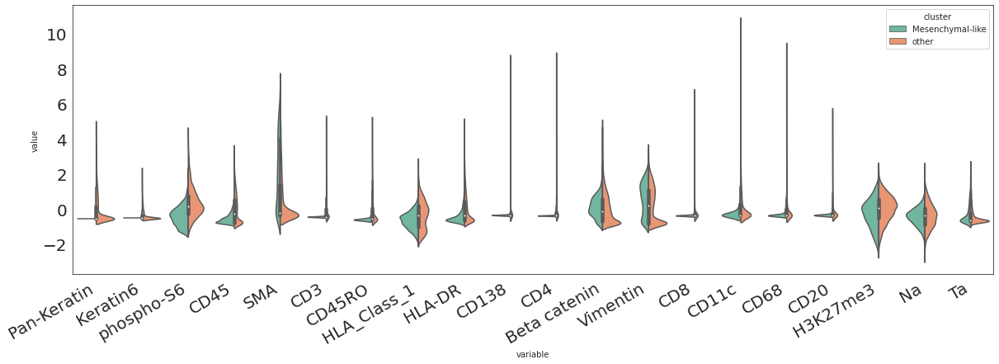

In [212]:
diff_var = DE_pval.loc[DE_pval['Kolmogorov-Smirnov'] <= 0.05, 'Kolmogorov-Smirnov'].sort_values()
var_names = diff_var.iloc[:20].index

dist1 = exp.loc[select_1, var_names]
dist2 = exp.loc[select_2, var_names]
dist1['cluster'] = GROUP_TGT
dist2['cluster'] = GROUP_REF
dist1['cell id'] = dist1.index
dist2['cell id'] = dist2.index

wide = dist1.append(dist2)
long = pd.melt(wide, id_vars=['cell id', 'cluster'], value_vars=var_names)

sns.set_style("white")
plt.figure(figsize=(20, 6))
ax = sns.violinplot(x="variable", y="value", hue="cluster",
                    data=long, palette="Set2", split=True)
plt.xticks(rotation=30, ha='right', fontsize=20);
plt.yticks(fontsize=20);
title = 'omics - DE {} vs {}'.format(GROUP_TGT, GROUP_REF)
plt.savefig(imdir.joinpath(title), bbox_inches='tight')

## Substraction of cell type contribution

In [230]:
data = exp[markers]

umap_cell_types = umap.UMAP(n_components=2, random_state=0).fit_transform(data)

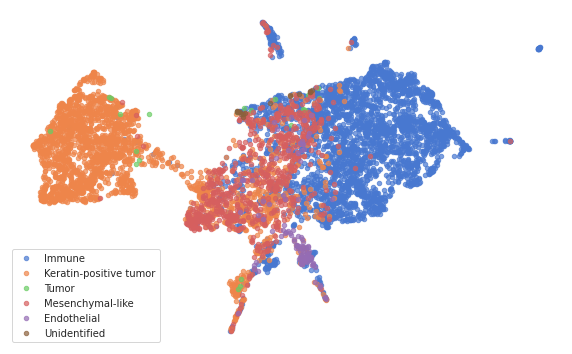

In [256]:
# ax = sns.relplot(
#      x=umap_cell_types[:,0], y=umap_cell_types[:,1],
#      hue=nodes['cell type'], palette='tab10')
# ax.set_axis_off()
# ax.set_aspect('equal')

fig, ax = plt.subplots(figsize=(10,10))
labels = attribute
uniq = labels.unique()
# color nodes with manual colors
att_colors = sns.color_palette('muted').as_hex() 
color_mapper = dict(zip(uniq, att_colors))
for label in uniq:
#     if label == 'Keratin-positive tumor':
#         continue
    select = labels == label
    color = color_mapper[label]
    ax.scatter(umap_cell_types[select,0], umap_cell_types[select,1], c=color, label=label, s=20, alpha=0.7)
plt.legend()
ax.set_axis_off()
ax.set_aspect('equal')
plt.savefig(imdir.joinpath('MIBI-TOF - UMAP cell type'), bbox_inches=('tight'))

In [251]:
uniq

array(['Immune', 'Keratin-positive tumor', 'Tumor', 'Mesenchymal-like',
       'Endothelial', 'Unidentified'], dtype=object)

In [234]:
# Get the mean contributions of each phenotype to mRNA counts
mean_pheno = {}
std_pheno = {}
for pheno in attribute.unique():
    select = attribute == pheno
    mean_var = data.loc[select,:].mean(axis=0)
    std_var = data.loc[select,:].std(axis=0)
    mean_pheno[pheno] = mean_var
    std_pheno[pheno] = std_var

In [236]:
# Retrieve the mean contributions of phenotypes
data_sub = copy.deepcopy(data)
for pheno in attribute.unique():
    select = attribute == pheno
    data_sub.loc[select,:] = data_sub.loc[select,:] - mean_pheno[pheno]

In [237]:
umap_sub = umap.UMAP(n_components=2, random_state=0).fit_transform(data_sub)

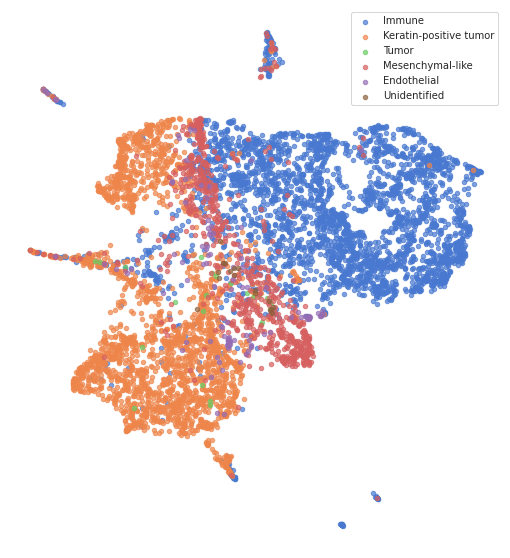

In [257]:
fig, ax = plt.subplots(figsize=(10,10))
labels = attribute
uniq = labels.unique()
# color nodes with manual colors
att_colors = sns.color_palette('muted').as_hex() 
color_mapper = dict(zip(uniq, att_colors))
for label in uniq:
    select = labels == label
    color = color_mapper[label]
    ax.scatter(umap_sub[select,0], umap_sub[select,1], 
               c=color, 
               label=label, 
               s=20,
               alpha=0.7)
plt.legend()
ax.set_axis_off()
ax.set_aspect('equal')
plt.savefig(imdir.joinpath('MIBI-TOF - UMAP cell type substracted'), bbox_inches=('tight'))

### Aggregation

In [268]:
X = data_sub.values

In [ ]:
RUN_SCREEN = False
PLOT_PHENOMAP = False

nb_var = X.shape[1]
save_dir = Path(f'../data/processed/MIBI-TOF/subtracted_phenotype/nb_var {nb_var}')
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

orders = [1, 2, 3]

if RUN_SCREEN:
    if PLOT_PHENOMAP:
        nb_axes = 3
        plot_width = 22
        ax_id = 0
    else:
        nb_axes = 2
        plot_width = 16
        ax_id = -1
        
    for order in orders:
        # compute statistics on aggregated data across neighbors
        var_aggreg = mosna.aggregate_k_neighbors(X=X, pairs=pairs, order=order, var_names=markers)

        # Dimension reduction for visualization
        embed_viz = umap.UMAP(n_components=2, random_state=0).fit_transform(var_aggreg)

        for dim_clust in [2,3,4,5,6,7,8,9]:
            # Dimension reduction for clustering
            embed_clust = umap.UMAP(n_neighbors=30,
                                    min_dist=0.0,
                                    n_components=dim_clust,
                                    random_state=0,
                                   ).fit_transform(var_aggreg)

            for min_cluster_size in [10,20,30,40,50,60,70,80,90,100]:
                # Clustering
                if SOFT_CLUST:
                    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1, prediction_data=True)
                    clusterer.fit(embed_clust)
                    soft_clusters = hdbscan.all_points_membership_vectors(clusterer)
                    labels_hdbs = soft_clusters.argmax(axis=1)
                else:
                    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1)
                    clusterer.fit(embed_clust)
                    labels_hdbs = clusterer.labels_
                nb_clust_hdbs = labels_hdbs.max() + 1
                print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")
                hdbs_cmap = mosna.make_cluster_cmap(labels_hdbs)

    #             # Histogram of classes
    #             fig = plt.figure()
    #             class_id, class_count = np.unique(labels_hdbs, return_counts=True)
    #             plt.bar(class_id, class_count, width=0.8);
    #             plt.title('Clusters histogram');
    #             title = f"Clusters histogram - nb_var {nb_var} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}"
    #             plt.savefig(str(save_dir / title) + '.png', bbox_inches='tight')
    #             plt.show()            

                # Big summary plot
                fig, ax = plt.subplots(1, nb_axes, figsize=(plot_width, 7), tight_layout=False)
                
                if PLOT_PHENOMAP:
                    ty.plot_network(coords, pairs, labels=nodes['Group'], legend=False, size_nodes=size_points, ax=ax[0])
                    ax[0].set_title('Spatial map of phenotypes for omics data', fontsize=14);

                ax[ax_id+1].scatter(nodes.loc[:,'x'], nodes.loc[:,'y'], c=labels_hdbs, cmap=hdbs_cmap, marker=marker, s=size_points)
                ax[ax_id+1].set_title('Spatial map of detected areas for omics data', fontsize=14);
                ax[ax_id+1].set_aspect('equal')

                ax[ax_id+2].scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_hdbs, s=5, cmap=hdbs_cmap);
                ax[ax_id+2].set_title("HDBSCAN clustering on aggregated neighbors' data", fontsize=14);
    #             ax[2].set_aspect('equal')

                suptitle = f"Spatial omics data and detected areas - nb_var {nb_var} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}";
                fig.suptitle(suptitle, fontsize=18)

                fig.savefig(save_dir / suptitle, bbox_inches='tight')
                plt.show()

In [269]:
# For the visualization
marker = 'o'
size_points = 10

order = 2
dim_clust = 9
min_cluster_size = 90
nb_var = X.shape[1]

# compute statistics on aggregated data across neighbors
var_aggreg = mosna.aggregate_k_neighbors(X=X, pairs=pairs, order=order, var_names=markers)

# Dimension reduction for visualization
embed_viz = umap.UMAP(n_components=2, random_state=0).fit_transform(var_aggreg)


# Dimension reduction for clustering
embed_clust = umap.UMAP(n_neighbors=30,
                        min_dist=0.0,
                        n_components=dim_clust,
                        random_state=0,
                       ).fit_transform(var_aggreg)

# Clustering
if SOFT_CLUST:
    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1, prediction_data=True)
    clusterer.fit(embed_clust)
    soft_clusters = hdbscan.all_points_membership_vectors(clusterer)
    labels_hdbs = soft_clusters.argmax(axis=1)
else:
    clusterer = hdbscan.HDBSCAN(metric='euclidean', min_cluster_size=min_cluster_size, min_samples=1)
    clusterer.fit(embed_clust)
    labels_hdbs = clusterer.labels_

hdbs_cmap = mosna.make_cluster_cmap(labels_hdbs)
nb_clust_hdbs = labels_hdbs.max() + 1
print(f"HDBSCAN has detected {nb_clust_hdbs} clusters")

HDBSCAN has detected 21 clusters


Text(0.5, 0.98, 'Spatial omics data and detected areas with subtracted phenotypes - nb_var 49 - order 2 - dim_clust 9 - min_cluster_size 90')

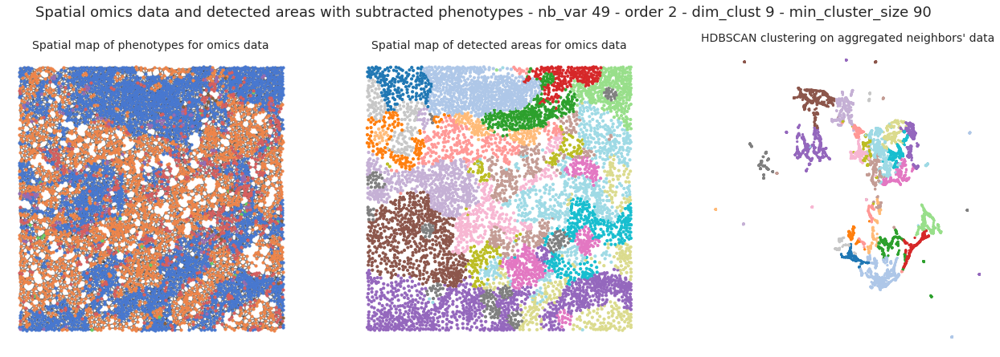

In [271]:
# # Histogram of classes
# fig = plt.figure()
# class_id, class_count = np.unique(labels_hdbs, return_counts=True)
# plt.bar(class_id, class_count, width=0.8);
# plt.title('Clusters histogram');

fig, ax = plt.subplots(1, 3, figsize=(22,7), tight_layout=False)

ty.plot_network(coords, pairs, labels=nodes['Group'], legend=False, size_nodes=size_points, ax=ax[0])
ax[0].set_title('Spatial map of phenotypes for omics data', fontsize=14);
ax[0].set_axis_off()

ax[1].scatter(nodes.loc[:,'x'], nodes.loc[:,'y'], c=labels_hdbs, cmap=hdbs_cmap, marker=marker, s=size_points)
ax[1].set_title('Spatial map of detected areas for omics data', fontsize=14);
ax[1].set_aspect('equal')
ax[1].set_axis_off()

ax[2].scatter(embed_viz[:, 0], embed_viz[:, 1], c=labels_hdbs, s=5, cmap=hdbs_cmap);
ax[2].set_title("HDBSCAN clustering on aggregated neighbors' data", fontsize=14);
ax[1].set_aspect('equal')
ax[2].set_axis_off()

suptitle = f"Spatial omics data and detected areas with subtracted phenotypes - nb_var {nb_var} - order {order} - dim_clust {dim_clust} - min_cluster_size {min_cluster_size}";
fig.suptitle(suptitle, fontsize=18)

### Manual DE analysis

In [272]:
var_names = var_aggreg.columns
distrib_pval = {
    'Welch': [],
#     'Mann-Whitney': [],
    'Kolmogorov-Smirnov': [],
}
# target group of interest
GROUP_TGT = 16
# group of reference
GROUP_REF = 17
# GROUP_TGT = 16
# GROUP_REF = 11

# from before phenotype subtraction
select_1 = copy.deepcopy(select_1_orig)
select_2 = copy.deepcopy(select_2_orig)

for var_name in var_names:
    dist1 = var_aggreg.loc[select_1, var_name]
    dist2 = var_aggreg.loc[select_2, var_name]
    w_stat, w_pval = ttest_ind(dist1, dist2, equal_var=False)
#     mwu_stat, mwu_pval = mannwhitneyu(dist1, dist2)
    ks_stat, ks_pval = ks_2samp(dist1, dist2)
    distrib_pval['Welch'].append(w_pval)
#     distrib_pval['Mann-Whitney'].append(mwu_pval)
    distrib_pval['Kolmogorov-Smirnov'].append(ks_pval)
DE_pval = pd.DataFrame(distrib_pval, index=var_names)

In [273]:
DE_pval.T.style.apply(highlight_under)

,C mean,Na mean,Si mean,P mean,Ca mean,Fe mean,dsDNA mean,Vimentin mean,SMA mean,Background mean,B7H3 mean,FoxP3 mean,Lag3 mean,CD4 mean,CD16 mean,CD56 mean,OX40 mean,PD1 mean,CD31 mean,PD-L1 mean,EGFR mean,Ki67 mean,CD209 mean,CD11c mean,CD138 mean,CD163 mean,CD68 mean,CSF-1R mean,CD8 mean,CD3 mean,IDO mean,Keratin17 mean,CD63 mean,CD45RO mean,CD20 mean,p53 mean,Beta catenin mean,HLA-DR mean,CD11b mean,CD45 mean,H3K9ac mean,Pan-Keratin mean,H3K27me3 mean,phospho-S6 mean,MPO mean,Keratin6 mean,HLA_Class_1 mean,Ta mean,Au mean,C std,Na std,Si std,P std,Ca std,Fe std,dsDNA std,Vimentin std,SMA std,Background std,B7H3 std,FoxP3 std,Lag3 std,CD4 std,CD16 std,CD56 std,OX40 std,PD1 std,CD31 std,PD-L1 std,EGFR std,Ki67 std,CD209 std,CD11c std,CD138 std,CD163 std,CD68 std,CSF-1R std,CD8 std,CD3 std,IDO std,Keratin17 std,CD63 std,CD45RO std,CD20 std,p53 std,Beta catenin std,HLA-DR std,CD11b std,CD45 std,H3K9ac std,Pan-Keratin std,H3K27me3 std,phospho-S6 std,MPO std,Keratin6 std,HLA_Class_1 std,Ta std,Au std
Welch,nan,0.000000,0.000000,0.000795,0.000017,0.000000,0.000000,0.000000,0.000000,0.000000,0.925303,0.118174,0.000000,0.003450,0.000000,0.000000,0.136229,0.000000,0.000000,0.000000,0.000004,0.204337,0.003420,0.000000,0.559264,0.000081,0.000000,0.000000,0.000000,0.000000,0.000000,0.179447,0.000000,0.000000,0.000000,0.000951,0.000000,0.000000,0.000003,0.000000,0.001368,0.000001,0.917310,0.000000,0.010950,0.000000,0.000000,0.000000,0.000000,nan,0.000000,0.000000,0.066169,0.000000,0.000007,0.006136,0.000000,0.000000,0.000000,0.010056,0.958445,0.000000,0.000000,0.000000,0.000409,0.000000,0.000000,0.000000,0.000000,0.003173,0.594649,0.087783,0.000000,0.005309,0.000058,0.000000,0.000000,0.000000,0.000000,0.000000,0.049544,0.000000,0.000000,0.037507,0.000589,0.000000,0.000163,0.000442,0.000011,0.000000,0.001506,0.419793,0.000000,0.000230,0.670046,0.000084,0.000000,0.000000
Kolmogorov-Smirnov,1.000000,0.000000,0.000000,0.000006,0.000001,0.000000,0.000000,0.000000,0.000000,0.000000,0.060674,0.000000,0.000000,0.001354,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000211,0.000000,0.004164,0.000000,0.000000,0.000000,0.000000,0.000000,0.000059,0.000036,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.018356,0.000036,0.713941,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000003,0.000000,0.007875,0.000000,0.000000,0.000015,0.000004,0.000000,0.000032,0.082358,0.000000,0.000000,0.000000,0.000000,0.000000,0.000002,0.000000,0.000000,0.000000,0.000003,0.000000,0.000639,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.030950,0.000000,0.000000,0.001177,0.000000,0.000113,0.000000,0.000001,0.280270,0.000000,0.000002,0.000052,0.000722,0.000000,0.000000


In [274]:
diff_var = DE_pval.loc[DE_pval['Kolmogorov-Smirnov'] <= 0.05, 'Kolmogorov-Smirnov'].sort_values()
diff_var

Si mean        1.550140e-121
CD63 mean       6.454399e-99
CD63 std        1.339040e-87
Fe mean         6.577912e-80
CD68 mean       1.420160e-65
                   ...      
CD4 mean        1.353885e-03
CD138 mean      4.163728e-03
P std           7.875394e-03
H3K9ac mean     1.835598e-02
CD20 std        3.094996e-02
Name: Kolmogorov-Smirnov, Length: 92, dtype: float64

In [275]:
diff_var = DE_pval.loc[DE_pval['Kolmogorov-Smirnov'] <= 0.05, 'Kolmogorov-Smirnov'].sort_values()
var_names = diff_var.iloc[:20].index

dist1 = var_aggreg.loc[select_1, var_names]
dist2 = var_aggreg.loc[select_2, var_names]
dist1['cluster'] = GROUP_TGT
dist2['cluster'] = GROUP_REF
dist1['cell id'] = dist1.index
dist2['cell id'] = dist2.index

In [276]:
wide = dist1.append(dist2)

In [277]:
long = pd.melt(wide, id_vars=['cell id', 'cluster'], value_vars=var_names)

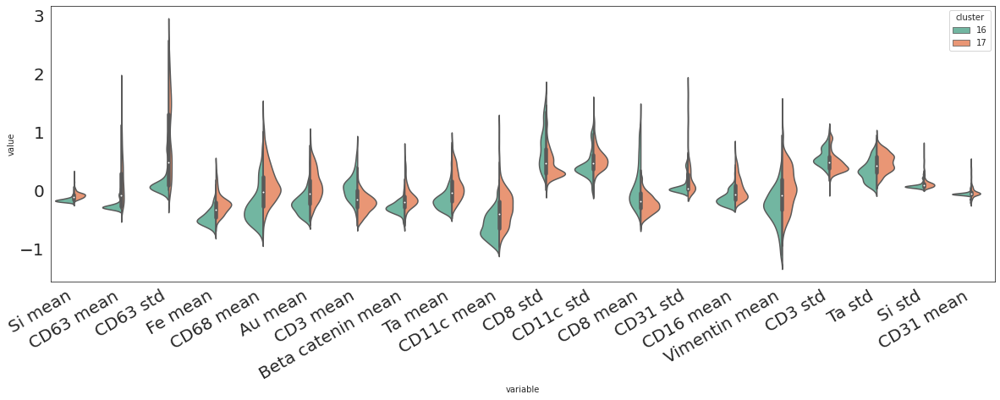

In [280]:
sns.set_style("white")
plt.figure(figsize=(20, 6))
ax = sns.violinplot(x="variable", y="value", hue="cluster",
                    data=long, palette="Set2", split=True)
plt.xticks(rotation=30, ha='right', fontsize=20);
plt.yticks(fontsize=20);
title = 'MIBI-TOF subtracted phenotypes- DE {} vs {}'.format(GROUP_TGT, GROUP_REF)
plt.savefig(imdir.joinpath(title), bbox_inches='tight')

## Assortativity all samples

In [285]:
map_att = {
    1: 'Unidentified',
    2: 'Immune',
    3: 'Endothelial',
    4: 'Mesenchymal-like',
    5: 'Tumor',
    6: 'Keratin-positive tumor',
}
obj['Group'] = obj['Group'].map(map_att)
uniq_att = obj['Group'].unique()

In [348]:
obj['SampleID'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 31, 32, 33, 34, 35,
       36, 37, 38, 39, 40, 41, 42, 43, 44])

In [351]:
samples.index[30:]

Int64Index([31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41], dtype='int64', name='patient')

In [ ]:
EXPORT_NETWORK = False
PLOT_NETWORK = True
n_shuffle = 500

save_dir = Path('../data/processed/MIBI-TOF/all_samples')
if not os.path.exists(save_dir):
    os.makedirs(save_dir)

cohort = []


col_cohort = (
    ['patient', '# total'] +
    ['% ' + x for x in uniq_att] +
    ['assort', 'assort MEAN', 'assort STD', 'assort Z'] +
    mosna.attributes_pairs(uniq_att, prefix='', medfix=' - ', suffix='') +
    mosna.attributes_pairs(uniq_att, prefix='', medfix=' - ', suffix=' MEAN') +
    mosna.attributes_pairs(uniq_att, prefix='', medfix=' - ', suffix=' STD') +
    mosna.attributes_pairs(uniq_att, prefix='', medfix=' - ', suffix=' Z') 
)

from datetime import datetime
now = datetime.now()
# dd/mm/YY H:M:S
dt_string = now.strftime("%Y-%m-%d_%H:%M:%S")

for sample in samples.index[30:]:
    print(f"sample {sample}")
    if sample not in obj['SampleID'].unique():
        print("Skipping sample, no cell data available")
        continue
    
    exp = obj[obj['SampleID'] == sample]
    
    im = io.imread(pat_img[sample])
    im = clean_from_presence(im, values=exp['cellLabelInImage'])
    # ty.showim(im);

    coords = ty.mask_val_coord(im)
    coords = coords.values
    pairs = ty.build_delaunay(coords, trim_dist=False)
    distances = ty.distance_neighbors(coords, pairs)
    dist_threshold = 50
    select = distances < dist_threshold
    pairs = pairs[select,:]

    if PLOT_NETWORK:
        fig, ax = ty.plot_network(coords, pairs, labels=exp['Group'], legend=False, figsize=(12.5,12.5), size_nodes=10);
        ax.axis('off');
        # put legend outside the axis
        # see: https://stackoverflow.com/questions/4700614/how-to-put-the-legend-out-of-the-plot
        # Shrink current axis by 20%
        box = ax.get_position()
        ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])
        # Put a legend to the right of the current axis
        ax.legend(loc='center left', bbox_to_anchor=(1, 0.5));
        plt.savefig(save_dir / f"network-legend_sample-{sample}_delaunay", bbox_inches='tight', facecolor='white')

    edges = pd.DataFrame(data=pairs, columns=['source', 'target'])
    nodes = pd.DataFrame(data=coords, columns=['x', 'y'])
    nodes['Group'] = exp['Group'].values
    nodes = nodes.join(pd.get_dummies(nodes['Group']))
    # handle missing categories
    for cat in uniq_att:
        if cat not in nodes.columns:
            nodes[cat] = 0

    
    ## Assortativity

    # Network statistics
    mixmat = mosna.mixing_matrix(nodes, edges, uniq_att)
    assort = mosna.attribute_ac(mixmat)

    # ------ Randomization ------
    mixmat_rand, assort_rand = mosna.randomized_mixmat(nodes, edges, uniq_att, n_shuffle=n_shuffle, parallel=False)
    mixmat_mean, mixmat_std, mixmat_zscore = mosna.zscore(mixmat, mixmat_rand, return_stats=True)
    assort_mean, assort_std, assort_zscore = mosna.zscore(assort, assort_rand, return_stats=True)

    mixmat = mosna.mixmat_to_df(mixmat, uniq_att)
    mixmat_zscore = mosna.mixmat_to_df(mixmat_zscore, uniq_att)

    print("Assortativity by cell types: {}".format(assort))
    f, ax = plt.subplots(figsize=(9, 6))
    sns.heatmap(mixmat, center=0, cmap="vlag", annot=True, linewidths=.5, ax=ax)
    plt.savefig(save_dir / f"assortativity_sample-{sample}", bbox_inches='tight', facecolor='white')

    print("Z-scored assortativity by cell types: {}".format(assort_zscore))
    f, ax = plt.subplots(figsize=(9, 6))
    sns.heatmap(mixmat_zscore, center=0, cmap="vlag", annot=True, linewidths=.5, ax=ax)
    plt.savefig(save_dir / f"assortativity_z-scored_sample-{sample}", bbox_inches='tight', facecolor='white')

    # Save results
    n_cells = nodes.shape[0]
    sample_data = (
        [sample, n_cells] +
        [nodes[col].sum()/n_cells for col in uniq_att] +
        [assort, assort_mean, assort_std, assort_zscore] +
        mosna.mixmat_to_columns(mixmat.values) +
        mosna.mixmat_to_columns(mixmat_mean) +
        mosna.mixmat_to_columns(mixmat_std) +
        mosna.mixmat_to_columns(mixmat_zscore.values) 
    )
    cohort.append(sample_data)
    # save each sample analysis to be robust to VPN timeouts
    sample_data = pd.DataFrame(data=[sample_data], columns=col_cohort)
    sample_data.to_csv(save_dir.joinpath(f"sample_{sample}_network_analysis_{dt_string}.csv"), encoding='utf-8', index=False)

cohort = pd.DataFrame(cohort, columns=col_cohort)
cohort.to_csv(save_dir.joinpath('all_samples_network_analysis_'+dt_string+'.csv'), encoding='utf-8', index=False)

In [373]:
# impute nan values
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
imp = IterativeImputer(max_iter=50, random_state=0)

cohort = pd.read_csv(save_dir.joinpath('all_samples_network_analysis_'+dt_string+'.csv'))
# Some values are inf, the impute don't handle them
X = cohort.iloc[:,2:].values
replace = ~np.isfinite(X)
X[replace] = np.nan
cohort.iloc[:,2:] = imp.fit_transform(X)
cohort.to_csv(save_dir.joinpath('all_samples_network_analysis_'+dt_string+'_imputed.csv'), encoding='utf-8', index=False)

In [375]:
from tableone import TableOne

ModuleNotFoundError: No module named 'tableone'

In [ ]:
resp_var = 'BOR - binary'

table1 = TableOne(df_pow[col_deconv].join(df_pow[[resp_var]]), 
                  groupby=resp_var, 
                  dip_test=True, normal_test=True, tukey_test=True, 
                  pval=True, smd=True, htest_name=True)

# transform tableone object to dataframe
sig_var = table1.tableone
# discard the multiindex
sig_var.columns = sig_var.columns.droplevel(0)

sig_var = sig_var.sort_values(['P-Value'])
sig_var

In [ ]:
selected_auto = [x[0].replace(', mean (SD)', '') for x in sig_var.index[1:5]]


df_selected = df_pow[selected_auto].join(df_pow[[resp_var, 'dataset']])

dfm_selected = pd.melt(
    df_selected,
    id_vars=[resp_var, 'dataset'],
    value_vars=selected_auto,
    var_name='deconvolution',
    value_name='proportion',
    ignore_index=False,
)

f, ax = plt.subplots(figsize=(16,4))
# Boxplot
# sns.boxplot(
#     x='deconvolution', 
#     y='proportion',
#     data=dfm_selected,
#     hue=resp_var,
#     ax=ax,
#     showfliers=False,
# )
# Violinplot
sns.violinplot(
    x='deconvolution', 
    y='proportion',
    data=dfm_selected,
    hue=resp_var,
    ax=ax,
    showfliers=False,
)

plt.xticks(rotation=30, ha='right');
